<a href="https://colab.research.google.com/github/nikopaterniti98/hlt/blob/main/DataMining_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IMPORTS

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip "/content/drive/MyDrive/DM-PRJ/gun-data.zip"


Archive:  /content/drive/MyDrive/DM-PRJ/gun-data.zip
  inflating: data/incidents.csv      
  inflating: data/povertyByStateYear.csv  
  inflating: data/year_state_district_house.csv  


In [ ]:
!pip install geopandas

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
df_incidents = pd.read_csv('/content/data/incidents.csv')
df_poverty = pd.read_csv('/content/data/povertyByStateYear.csv')
df_districts = pd.read_csv('/content/data/year_state_district_house.csv')

pd.set_option('display.max_columns', None)

<ipython-input-286-cb106be66d2c>:1: DtypeWarning: Columns (15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df_incidents = pd.read_csv('/content/data/incidents.csv')


In [ ]:
df_incidents = pd.read_csv('/content/data/incidents.csv')
df_poverty = pd.read_csv('/content/data/povertyByStateYear.csv')
df_districts = pd.read_csv('/content/data/year_state_district_house.csv')

pd.set_option('display.max_columns', None)

<ipython-input-5-cb106be66d2c>:1: DtypeWarning: Columns (15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df_incidents = pd.read_csv('/content/data/incidents.csv')


In [ ]:
df_incidents.head()

,date,state,city_or_county,address,latitude,longitude,congressional_district,state_house_district,state_senate_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2
0,2015-05-02,Indiana,Indianapolis,Lafayette Road and Pike Plaza,39.8322,-86.2492,7.0,94.0,33.0,19.0,Adult 18+,Male,19.0,19.0,19.0,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,1.0,Teen wounded while walking - Security guard at...,Shot - Wounded/Injured,NaN
1,2017-04-03,Pennsylvania,Kane,5647 US 6,41.6645,-78.7856,5.0,NaN,NaN,62.0,Adult 18+,Male,62.0,62.0,62.0,0.0,0.0,1.0,1.0,0.0,1,0,0.0,0.0,1.0,shot self after accident,"Shot - Dead (murder, accidental, suicide)",Suicide^
2,2016-11-05,Michigan,Detroit,6200 Block of East McNichols Road,42.4190,-83.0393,14.0,4.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0.0,1.0,2.0,1 inj.,Shot - Wounded/Injured,NaN
3,2016-10-15,District of Columbia,Washington,"1000 block of Bladensburg Road, NE",38.9030,-76.9820,1.0,NaN,NaN,NaN,Adult 18+,Male,248339,707477,761203,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,2.0,NaN,Shot - Wounded/Injured,NaN
4,2030-06-14,Pennsylvania,Pittsburgh,California and Marshall Avenues,40.4621,-80.0308,14.0,NaN,NaN,NaN,Adult 18+,Male,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0,1,0.0,1.0,2.0,NaN,Shot - Wounded/Injured,"Drive-by (car to street, car to car)"


In [ ]:
df_poverty

,state,year,povertyPercentage
0,United States,2020,11.5
1,Alabama,2020,14.8
2,Alaska,2020,11.5
3,Arizona,2020,12.1
4,Arkansas,2020,15.8
...,...,...,...
879,Virginia,2004,9.1
880,Washington,2004,9.8
881,West Virginia,2004,15.0
882,Wisconsin,2004,10.9


In [ ]:
df_districts

,year,state,congressional_district,party,candidatevotes,totalvotes
10440,2022,WYOMING,0,REPUBLICAN,132206,198198
3052,1990,ALASKA,0,REPUBLICAN,99003,191647
3044,1988,WYOMING,0,REPUBLICAN,118350,177651
4648,1996,NORTH DAKOTA,0,DEMOCRAT,144833,263010
2102,1984,SOUTH DAKOTA,0,DEMOCRAT,181401,316222
3997,1994,DELAWARE,0,REPUBLICAN,137945,195008
8181,2012,SOUTH DAKOTA,0,REPUBLICAN,207640,361429
2142,1984,VERMONT,0,REPUBLICAN,148025,226297
6324,2004,MONTANA,0,REPUBLICAN,286076,444230
3012,1988,VERMONT,0,REPUBLICAN,98937,240131


In [ ]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239677 entries, 0 to 239676
Data columns (total 28 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   date                       239677 non-null  object 
 1   state                      239677 non-null  object 
 2   city_or_county             239677 non-null  object 
 3   address                    223180 non-null  object 
 4   latitude                   231754 non-null  float64
 5   longitude                  231754 non-null  float64
 6   congressional_district     227733 non-null  float64
 7   state_house_district       200905 non-null  float64
 8   state_senate_district      207342 non-null  float64
 9   participant_age1           147379 non-null  float64
 10  participant_age_group1     197558 non-null  object 
 11  participant_gender1        203315 non-null  object 
 12  min_age_participants       164879 non-null  object 
 13  avg_age_participants       16

In [ ]:
df_incidents.state.value_counts()

Illinois                17556
California              16306
Florida                 15029
Texas                   13577
Ohio                    10244
New York                 9712
Pennsylvania             8929
Georgia                  8925
North Carolina           8739
Louisiana                8103
Tennessee                7626
South Carolina           6939
Missouri                 6631
Michigan                 6136
Massachusetts            5981
Virginia                 5949
Indiana                  5852
Maryland                 5798
Alabama                  5471
New Jersey               5387
Wisconsin                4787
Kentucky                 4157
Mississippi              3599
Oklahoma                 3455
Washington               3434
Colorado                 3201
District of Columbia     3195
Connecticut              3067
Arkansas                 2842
Iowa                     2517
Minnesota                2408
Arizona                  2328
Oregon                   2286
Kansas    

sorted df is the incidents dataset sorted by state

In [ ]:
sorted_df = df_incidents.sort_values(by=['state'])
pd.set_option('display.max_columns', None)
sorted_df.head()

,date,state,city_or_county,address,latitude,longitude,congressional_district,state_house_district,state_senate_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2
85693,2016-06-29,Alabama,Dothan,600 block of East Newton Street,31.2289,-85.3868,2.0,85.0,28.0,25.0,Adult 18+,Male,25.0,25.0,25.0,0.0,0.0,1.0,1.0,0.0,0,0,1.0,0.0,1.0,NaN,Shots Fired - No Injuries,"Drive-by (car to street, car to car)"
220216,2030-05-25,Alabama,Mobile,Warren and South Carolina Streets,30.6694,-88.0493,1.0,97.0,33.0,NaN,Adult 18+,Female,NaN,NaN,NaN,0.0,0.0,2.0,1.0,1.0,0,0,0.0,2.0,2.0,NaN,Non-Shooting Incident,Car-jacking
137613,2016-09-21,Alabama,Semmes,Farrington Loop,30.7366,-88.2438,1.0,102.0,34.0,39.0,Adult 18+,Male,35.0,37.0,39.0,0.0,0.0,2.0,2.0,0.0,1,0,1.0,0.0,2.0,"unspec dv, shot in chest","Shot - Dead (murder, accidental, suicide)",Domestic Violence
57191,2016-02-28,Alabama,Ashville,285 5th Avenue,33.8373,-86.2533,3.0,30.0,17.0,41.0,Adult 18+,Female,41.0,41.0,41.0,0.0,0.0,2.0,1.0,1.0,1,0,0.0,1.0,2.0,"DV, wife had restraining order against husband...","Shot - Dead (murder, accidental, suicide)",Officer Involved Incident
137577,2016-09-03,Alabama,Mobile,651 Azalea Rd.,30.6563,-88.1435,1.0,103.0,35.0,27.0,Adult 18+,Male,24.0,26.0,27.0,0.0,0.0,2.0,2.0,0.0,1,0,1.0,0.0,2.0,NaN,"Shot - Dead (murder, accidental, suicide)",NaN


In [ ]:
state_df = sorted_df[['state','city_or_county']]

In [ ]:
state_df.head()

,state,city_or_county
85693,Alabama,Dothan
220216,Alabama,Mobile
137613,Alabama,Semmes
57191,Alabama,Ashville
137577,Alabama,Mobile


# INCIDENTS DATASET - STATE/CITY

In [ ]:
# UTILS
def get_stats(attribute,df):
    stats = df[attribute].describe(datetime_is_numeric=True)
    stats["missing"] = df[attribute].isna().sum()
    return stats


SUMMARY OF NULL VALUES FOR EACH ATTRIBUTE



In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(df_incidents.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

DESCRIPTION OF MANY STATISTICS ABOUT EVERY COLUMN SUCH US THE NUMBER OF UNIQUE VALUES IN EAECH COLUMN, THE VALUE OCCURRING MORE IN EACH COLUMN,THE NUMBER OF OCCURRENCES THE TOP FEATURE HAS ECC...

In [ ]:
df_incidents.describe(include="all", datetime_is_numeric=True)

,date,state,city_or_county,address,latitude,longitude,congressional_district,state_house_district,state_senate_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2
count,239677,239677,239677,223180,231754.000000,231754.000000,227733.000000,200905.000000,207342.00000,147379.000000,197558,203315,164879,165057,164969,197573,197578,197575.0,203315.000000,203315.000000,239677.000000,239677.000000,212051.000000,212051.000000,239677.000000,158660,239351,141931
unique,2437,51,12898,198037,NaN,NaN,NaN,NaN,NaN,NaN,3,3,12673,12869,12852,32,42,70.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,136652,52,90
top,2017-01-01,Illinois,Chicago,2375 International Pkwy,NaN,NaN,NaN,NaN,NaN,NaN,Adult 18+,Male,19.0,22.0,24.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,man shot,Shot - Wounded/Injured,Officer Involved Incident
freq,342,17556,10814,160,NaN,NaN,NaN,NaN,NaN,NaN,181324,177945,7981,7606,6237,105933,104989,62938.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,501,93926,13881
mean,NaN,NaN,NaN,NaN,37.546598,-89.338348,8.001265,55.447132,20.47711,30.295707,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.520252,0.212340,0.252290,0.494007,0.468439,0.494169,1.636895,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,5.130763,14.359546,8.480835,42.048117,14.20456,13.363592,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.996767,0.490888,0.521779,0.729952,0.851035,0.925566,1.252514,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,19.111400,-171.429000,0.000000,1.000000,1.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,33.903400,-94.158725,2.000000,21.000000,9.00000,21.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,38.570600,-86.249600,5.000000,47.000000,19.00000,27.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,41.437375,-80.048625,10.000000,84.000000,30.00000,37.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,2.000000,NaN,NaN,NaN


THE GET STATS FUNCTION EXTRACTS SOME INFORMATIONS ABOUT A SPECIFIC COLUMN OF THE DATAFRAME

In [ ]:
print(get_stats("state", df_incidents))

count        239677
unique           51
top        Illinois
freq          17556
missing           0
Name: state, dtype: object


NUMBER OF INCIDENTS FOR EACH STATE

In [ ]:
incident_number = state_df['state'].value_counts()
incident_number.plot(kind='bar')

Here we can find the number of incidents sorted in descending order, starting by the city with the highest number of crimes which is Chicago, obviously in Illinois which we found to be the state with the most crimes

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
city_counts = state_df.groupby(['state', 'city_or_county']).size().reset_index(name='incident_count')
city_counts.sort_values(by=['incident_count'],ascending=False)

,state,city_or_county,incident_count
4070,Illinois,Chicago,10814
6592,Maryland,Baltimore,3943
2524,District of Columbia,Washington,3189
6191,Louisiana,New Orleans,3070
13500,Pennsylvania,Philadelphia,2929
...,...,...,...
8387,Mississippi,Russell,1
8388,Mississippi,Sallis,1
8390,Mississippi,Sandy Hook,1
8393,Mississippi,Scooba,1


In [ ]:
df_incidents['state'] = df_incidents['state'].str.upper()

In [ ]:
# Dizionario dei codici statali
state_abbreviations = {
    'ALABAMA': 'AL', 'ALASKA': 'AK', 'ARIZONA': 'AZ', 'ARKANSAS': 'AR',
    'CALIFORNIA': 'CA', 'COLORADO': 'CO', 'CONNECTICUT': 'CT', 'DELAWARE': 'DE',
    'FLORIDA': 'FL', 'GEORGIA': 'GA', 'HAWAII': 'HI', 'IDAHO': 'ID',
    'ILLINOIS': 'IL', 'INDIANA': 'IN', 'IOWA': 'IA', 'KANSAS': 'KS',
    'KENTUCKY': 'KY', 'LOUISIANA': 'LA', 'MAINE': 'ME', 'MARYLAND': 'MD',
    'MASSACHUSETTS': 'MA', 'MICHIGAN': 'MI', 'MINNESOTA': 'MN', 'MISSISSIPI': 'MS',
    'MISSOURI': 'MO', 'MONTANA': 'MT', 'NEBRASKA': 'NE', 'NEVADA': 'NV',
    'NEW HAMPSHIRE': 'NH', 'NEW JERSEY': 'NJ', 'NEW MEXICO': 'NM', 'NEW YORK': 'NY',
    'NORTH CAROLINA': 'NC', 'NORTH DAKOTA': 'ND', 'OHIO': 'OH', 'OKLAHOMA': 'OK',
    'OREGON': 'OR', 'PENNSYLVANIA': 'PA', 'RHODE ISLAND': 'RI', 'SOUTH CAROLINA': 'SC',
    'SOUTH DAKOTA': 'SD', 'TENNESSEE': 'TN', 'TEXAS': 'TX', 'UTAH': 'UT',
    'VERMONT': 'VT', 'VIRGINIA': 'VA', 'WASHINGTON': 'WA', 'WEST VIRGINIA': 'WV',
    'WISCONSIN': 'WI', 'WYOMING': 'WY'
}

# Aggiungere la colonna con i codici statali usando il dizionario per la mappatura
df_incidents['state_code'] = df_incidents['state'].map(state_abbreviations)

In [ ]:
state_counts = df_incidents['state'].value_counts().reset_index()
state_counts.columns = ['state','Incident Count']
state_counts['state_code'] = state_counts['state'].map(state_abbreviations)
state_counts

,state,Incident Count,state_code
0,ILLINOIS,17556,IL
1,CALIFORNIA,16306,CA
2,FLORIDA,15029,FL
3,TEXAS,13577,TX
4,OHIO,10244,OH
5,NEW YORK,9712,NY
6,PENNSYLVANIA,8929,PA
7,GEORGIA,8925,GA
8,NORTH CAROLINA,8739,NC
9,LOUISIANA,8103,LA


In [ ]:
import plotly.express as px
import pandas as pd


# Load the USA map from Plotly
fig = px.choropleth(
    state_counts,
    locations='state_code',
    locationmode='USA-states',
    color='Incident Count',
    scope="usa",
    color_continuous_scale="Blues",
    title='Distribution of Incidents by State'
)

# Show the plot
fig.show()

# INCIDENTS DATASET - DISTRICT

In [ ]:
district_df = sorted_df[['state','city_or_county','congressional_district','state_house_district','state_senate_district']]
district_df.head()

,state,city_or_county,congressional_district,state_house_district,state_senate_district
85693,Alabama,Dothan,2.0,85.0,28.0
220216,Alabama,Mobile,1.0,97.0,33.0
137613,Alabama,Semmes,1.0,102.0,34.0
57191,Alabama,Ashville,3.0,30.0,17.0
137577,Alabama,Mobile,1.0,103.0,35.0


INFO ABOUT THE DISTRICTS THE INCIDENT TOOK PLACE IN

In [ ]:
district_counts = district_df.groupby(['state',
                                       'city_or_county',
                                       'congressional_district',
                                       'state_house_district',
                                       'state_senate_district']).size().reset_index(name='incident_count')

temp = district_counts.sort_values(by=['incident_count'],ascending=False)

In [ ]:
Illinois_districts = district_counts[district_counts['state'] == 'Illinois']
Illinois_districts.sort_values(by=['incident_count'],ascending=False)

,state,city_or_county,congressional_district,state_house_district,state_senate_district,incident_count
7556,Illinois,Chicago,7.0,10.0,5.0,1225
7555,Illinois,Chicago,7.0,9.0,5.0,879
8072,Illinois,Peoria,17.0,92.0,46.0,805
7554,Illinois,Chicago,7.0,8.0,4.0,690
8128,Illinois,Rockford,17.0,67.0,34.0,646
...,...,...,...,...,...,...
7811,Illinois,Hanna City,18.0,73.0,37.0,1
7810,Illinois,Hancock (county),18.0,94.0,47.0,1
7809,Illinois,Hamilton,18.0,94.0,47.0,1
7808,Illinois,Gurnee,14.0,61.0,31.0,1


In [ ]:
chicago_districts = district_counts[district_counts['city_or_county'] == 'Chicago']
chicago_districts.sort_values(by=['incident_count'],ascending=False)

,state,city_or_county,congressional_district,state_house_district,state_senate_district,incident_count
7556,Illinois,Chicago,7.0,10.0,5.0,1225
7555,Illinois,Chicago,7.0,9.0,5.0,879
7554,Illinois,Chicago,7.0,8.0,4.0,690
7552,Illinois,Chicago,7.0,6.0,3.0,576
7487,Illinois,Chicago,1.0,31.0,16.0,419
...,...,...,...,...,...,...
7523,Illinois,Chicago,4.0,19.0,10.0,1
7530,Illinois,Chicago,4.0,77.0,39.0,1
7534,Illinois,Chicago,5.0,9.0,5.0,1
7545,Illinois,Chicago,5.0,78.0,39.0,1


In [ ]:
congressionaldistrict_occurrences = df_incidents['congressional_district'].value_counts()
pd.set_option('display.max_rows', None)

print(congressionaldistrict_occurrences)

1.0     36910
2.0     26945
3.0     20621
7.0     19709
4.0     18469
5.0     16512
9.0      9867
6.0      9388
8.0      7353
13.0     6175
12.0     5770
10.0     5606
11.0     5260
14.0     4291
17.0     2925
16.0     2842
18.0     2614
20.0     2600
24.0     2042
15.0     1943
26.0     1847
19.0     1701
27.0     1425
22.0     1424
25.0     1354
23.0     1305
21.0     1276
35.0     1135
30.0      788
31.0      773
29.0      727
36.0      659
33.0      522
28.0      497
0.0       421
44.0      421
32.0      361
34.0      337
43.0      314
47.0      292
37.0      266
46.0      251
38.0      249
40.0      235
51.0      228
41.0      211
52.0      158
53.0      130
48.0      119
42.0      118
50.0      116
49.0      100
39.0       86
45.0       45
Name: congressional_district, dtype: int64


# INCIDENTS CHARATERISTICS

In [ ]:
unique_dates = df_incidents['date'].unique()
print(unique_dates)

['2015-05-02' '2017-04-03' '2016-11-05' ... '2013-07-24' '2013-12-14'
 '2013-04-18']


TRANSFORM YEARS 2030, 2029, 2028 IN 2020, 2019, 2018

In [ ]:
import pandas as pd

# Assuming your dataframe is named 'df' and the date column is named 'date_column'
df_incidents['date'] = pd.to_datetime(df_incidents['date'])

# Replace years 2030, 2029, 2028 with 2020, 2019, 2018 respectively
df_incidents['date'] = df_incidents['date'].apply(lambda x: x.replace(year=x.year - 10) if x.year in [2030, 2029, 2028] else x)

print("Highest Date:", df_incidents['date'].max())
print("Lowest Date:", df_incidents['date'].min())

Highest Date: 2020-11-28 00:00:00
Lowest Date: 2013-01-01 00:00:00


NUMBER OF INCIDENTS FOR EACH DATE

In [ ]:
#Comment the first row and uncomment the second if you want to keep the day in the dates

df_incidents['date'] = pd.to_datetime(df_incidents['date']).dt.to_period('M')
#df_incidents['date'] = pd.to_datetime(df_incidents['date'])
date_occurrences = df_incidents['date'].value_counts()
pd.set_option('display.max_rows', None)

print(date_occurrences)

2017-05    5666
2017-04    5577
2017-07    5547
2016-08    5527
2017-01    5258
2016-10    5251
2016-07    5250
2017-08    5202
2017-10    5200
2017-06    5158
2016-12    5153
2016-11    5092
2017-03    4994
2016-09    4937
2018-01    4928
2016-05    4902
2016-03    4892
2017-11    4802
2017-09    4790
2018-03    4753
2016-04    4672
2017-12    4622
2016-01    4590
2017-02    4585
2016-06    4530
2015-12    4422
2015-07    4190
2015-08    4187
2018-02    4125
2015-09    4067
2015-05    3991
2016-02    3967
2014-08    3942
2015-06    3755
2015-10    3733
2014-07    3722
2014-09    3699
2015-04    3594
2015-11    3589
2014-10    3577
2015-03    3520
2015-01    3183
2014-12    3157
2014-01    3068
2014-06    3046
2014-05    3013
2014-11    2894
2014-04    2727
2014-03    2639
2015-02    2519
2014-02    2193
2019-07    1495
2019-06    1377
2019-09    1376
2019-05    1366
2019-01    1295
2019-08    1286
2019-10    1274
2019-04    1159
2019-03    1069
2020-05    1033
2020-07     920
2019-11 

  NUMBER OF INCIDENTS FOR EACH PARTICIPANT AGE

In [ ]:
participant_age1_occurrences = df_incidents['participant_age1'].value_counts()
pd.set_option('display.max_rows', None)

print(participant_age1_occurrences)

19.0     6842
20.0     6574
22.0     6552
21.0     6513
18.0     6483
23.0     6466
24.0     6394
25.0     5964
26.0     5529
27.0     5112
17.0     4693
28.0     4603
29.0     4355
30.0     4090
31.0     3754
32.0     3694
33.0     3494
34.0     3310
16.0     3228
35.0     3203
36.0     2753
37.0     2649
38.0     2381
39.0     2084
40.0     2075
15.0     2047
41.0     1751
42.0     1626
43.0     1615
44.0     1526
45.0     1477
46.0     1307
47.0     1260
48.0     1252
14.0     1203
50.0     1160
49.0     1125
52.0     1052
51.0     1043
53.0      967
54.0      928
55.0      887
56.0      782
57.0      726
13.0      704
58.0      644
60.0      617
59.0      612
61.0      531
62.0      484
63.0      417
12.0      379
65.0      357
64.0      341
3.0       305
67.0      304
66.0      296
68.0      271
11.0      268
4.0       258
71.0      250
70.0      249
10.0      235
69.0      234
2.0       232
7.0       220
9.0       214
5.0       210
8.0       208
6.0       188
72.0      163
73.0  

INCIDENTS CHARATERISTICS1

In [ ]:
nunique_values = df_incidents['incident_characteristics1'].nunique()
incidents_occurrences = df_incidents['incident_characteristics1'].value_counts()

print(f'There are {nunique_values} possible values')
print('//////////////////////////////////////////////////////////////////////////////////')
print(incidents_occurrences)

There are 52 possible values
//////////////////////////////////////////////////////////////////////////////////
Shot - Wounded/Injured                                                                                  93926
Shot - Dead (murder, accidental, suicide)                                                               45054
Non-Shooting Incident                                                                                   41541
Shots Fired - No Injuries                                                                               33949
Armed robbery with injury/death and/or evidence of DGU found                                             7528
Institution/Group/Business                                                                               4316
TSA Action                                                                                               2653
Brandishing/flourishing/open carry/lost/found                                                            1350
Home Inv

INCIDENTS CHARATERISTICS2

In [ ]:
nunique_values = df_incidents['incident_characteristics2'].nunique()
incidents_occurrences2 = df_incidents['incident_characteristics2'].value_counts()

print(f'There are {nunique_values} possible values')
print('//////////////////////////////////////////////////////////////////////////////////')
pd.set_option('display.max_rows', None)
print(incidents_occurrences2)

There are 90 possible values
//////////////////////////////////////////////////////////////////////////////////
Officer Involved Incident                                                                               13881
Drive-by (car to street, car to car)                                                                    11873
Drug involvement                                                                                        11717
Home Invasion                                                                                            8664
Shot - Dead (murder, accidental, suicide)                                                                8345
Armed robbery with injury/death and/or evidence of DGU found                                             6438
Possession (gun(s) found during commission of other crimes)                                              6084
ATF/LE Confiscation/Raid/Arrest                                                                          5916
Accident

# YEAR DISTRICT HOUSE DATASET

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
df = pd.read_csv('/content/data/year_state_district_house.csv')

FileNotFoundError: ignored

In [ ]:
df.info()

NameError: ignored

In [ ]:
print(df['party'].unique())
print(df['year'].unique())
print(df['congressional_district'].unique())

['REPUBLICAN' 'DEMOCRAT' 'FOGLIETTA (DEMOCRAT)' 'DEMOCRATIC-FARMER-LABOR'
 'INDEPENDENT' 'INDEPENDENT-REPUBLICAN']
[1976 1978 1980 1982 1984 1986 1988 1990 1992 1994 1996 1998 2000 2002
 2004 2006 2008 2010 2012 2014 2016 2018 2020 2022]
[ 1  2  3  4  5  6  7  0  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53]


In [ ]:
unique_state = df['state'].unique()
total_state = df['state'].count()

print(len(unique_state))
#verificare se gli stati unici sono correttamente tutti stati americani
print(unique_state)
print(total_state)

51
['ALABAMA' 'ALASKA' 'ARIZONA' 'ARKANSAS' 'CALIFORNIA' 'COLORADO'
 'CONNECTICUT' 'DELAWARE' 'FLORIDA' 'GEORGIA' 'HAWAII' 'IDAHO' 'ILLINOIS'
 'INDIANA' 'IOWA' 'KANSAS' 'KENTUCKY' 'LOUISIANA' 'MAINE' 'MARYLAND'
 'MASSACHUSETTS' 'MICHIGAN' 'MINNESOTA' 'MISSISSIPPI' 'MISSOURI' 'MONTANA'
 'NEBRASKA' 'NEVADA' 'NEW HAMPSHIRE' 'NEW JERSEY' 'NEW MEXICO' 'NEW YORK'
 'NORTH CAROLINA' 'NORTH DAKOTA' 'OHIO' 'OKLAHOMA' 'OREGON' 'PENNSYLVANIA'
 'RHODE ISLAND' 'SOUTH CAROLINA' 'SOUTH DAKOTA' 'TENNESSEE' 'TEXAS' 'UTAH'
 'VERMONT' 'VIRGINIA' 'WASHINGTON' 'WEST VIRGINIA' 'WISCONSIN' 'WYOMING'
 'DISTRICT OF COLUMBIA']
10441


In [ ]:
def is_us_state(input_string):
    us_states = {
        'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado',
        'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho',
        'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana',
        'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
        'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
        'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
        'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon',
        'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota',
        'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
        'West Virginia', 'Wisconsin', 'Wyoming'
    }
    return input_string in us_states

In [ ]:
#verificare se il numero di voti è maggiore del totale voti

# df_filtered = df.query('party in ("FOGLIETTA (DEMOCRAT)","INDEPENDENT-REPUBLICAN", "INDEPENDENT")')

# df_filtered

df_state_filtered = df.query('state == "DISTRICT OF COLUMBIA"')

df_state_filtered
filtro = df['state'] == 'DISTRICT OF COLUMBIA'

df = df[~filtro]
df
unique_state = df['state'].unique()
print (len(unique_state))

50


In [ ]:
df_filtered = df.query('party == "INDEPENDENT"')
print (len(df_filtered))
print (df_filtered)

10
      year     state  congressional_district        party  candidatevotes  \
3447  1990   VERMONT                       0  INDEPENDENT          117522   
3881  1992   VERMONT                       0  INDEPENDENT          162724   
4316  1994   VERMONT                       0  INDEPENDENT          105502   
4579  1996  MISSOURI                       8  INDEPENDENT          112472   
4751  1996   VERMONT                       0  INDEPENDENT          140678   
5186  1998   VERMONT                       0  INDEPENDENT          136403   
5621  2000   VERMONT                       0  INDEPENDENT          196118   
5626  2000  VIRGINIA                       5  INDEPENDENT          143312   
6057  2002   VERMONT                       0  INDEPENDENT          144880   
6492  2004   VERMONT                       0  INDEPENDENT          205774   

      totalvotes  
3447      209856  
3881      281162  
4316      211449  
4579      222854  
4751      254706  
5186      215133  
5621      283366

In [ ]:
# unire i dati dei partiti minoritari oppure non considerarli
df_filtered = df.query('congressional_district== 7 and state =="ILLINOIS"')
df_filtered

#calcolare il partito vincente per anno

,year,state,congressional_district,party,candidatevotes,totalvotes
106,1976,ILLINOIS,7,DEMOCRAT,88239,104094
541,1978,ILLINOIS,7,DEMOCRAT,64716,74989
976,1980,ILLINOIS,7,DEMOCRAT,80056,94097
1419,1982,ILLINOIS,7,DEMOCRAT,133978,154974
1854,1984,ILLINOIS,7,DEMOCRAT,135493,172908
2289,1986,ILLINOIS,7,DEMOCRAT,90761,113164
2724,1988,ILLINOIS,7,DEMOCRAT,135331,135331
3159,1990,ILLINOIS,7,DEMOCRAT,80021,100120
3607,1992,ILLINOIS,7,DEMOCRAT,182811,225281
4042,1994,ILLINOIS,7,DEMOCRAT,93457,117468


In [ ]:
import plotly.express as px
import pandas as pd
import matplotlib
import geopandas as gpd

df = pd.read_csv('/content/data/year_state_district_house.csv')

# Dizionario dei codici statali
state_abbreviations = {
    'ALABAMA': 'AL', 'ALASKA': 'AK', 'ARIZONA': 'AZ', 'ARKANSAS': 'AR',
    'CALIFORNIA': 'CA', 'COLORADO': 'CO', 'CONNECTICUT': 'CT', 'DELAWARE': 'DE',
    'FLORIDA': 'FL', 'GEORGIA': 'GA', 'HAWAII': 'HI', 'IDAHO': 'ID',
    'ILLINOIS': 'IL', 'INDIANA': 'IN', 'IOWA': 'IA', 'KANSAS': 'KS',
    'KENTUCKY': 'KY', 'LOUISIANA': 'LA', 'MAINE': 'ME', 'MARYLAND': 'MD',
    'MASSACHUSETTS': 'MA', 'MICHIGAN': 'MI', 'MINNESOTA': 'MN', 'MISSISSIPI': 'MS',
    'MISSOURI': 'MO', 'MONTANA': 'MT', 'NEBRASKA': 'NE', 'NEVADA': 'NV',
    'NEW HAMPSHIRE': 'NH', 'NEW JERSEY': 'NJ', 'NEW MEXICO': 'NM', 'NEW YORK': 'NY',
    'NORTH CAROLINA': 'NC', 'NORTH DAKOTA': 'ND', 'OHIO': 'OH', 'OKLAHOMA': 'OK',
    'OREGON': 'OR', 'PENNSYLVANIA': 'PA', 'RHODE ISLAND': 'RI', 'SOUTH CAROLINA': 'SC',
    'SOUTH DAKOTA': 'SD', 'TENNESSEE': 'TN', 'TEXAS': 'TX', 'UTAH': 'UT',
    'VERMONT': 'VT', 'VIRGINIA': 'VA', 'WASHINGTON': 'WA', 'WEST VIRGINIA': 'WV',
    'WISCONSIN': 'WI', 'WYOMING': 'WY'
}

# Aggiungere la colonna con i codici statali usando il dizionario per la mappatura
df['state_code'] = df['state'].map(state_abbreviations)

# Raggruppiamo per anno e partito e sommiamo i voti
votes_per_year_party = df.groupby(['year', 'state_code','party'])['candidatevotes'].sum().reset_index()

# Calcoliamo il totale dei voti per anno
total_votes_per_year = df.groupby('year')['candidatevotes'].sum().reset_index()

# Merge the total votes back to our votes_per_year_party dataframe
votes_per_year_party = votes_per_year_party.merge(total_votes_per_year, on='year', suffixes=('', '_total'))

# Calcoliamo la percentuale dei voti per partito per anno
votes_per_year_party['percentage_of_votes'] = (votes_per_year_party['candidatevotes'] / votes_per_year_party['candidatevotes_total']) * 100

# Ordiniamo i risultati per anno e poi per percentuale di voti in ordine decrescente
votes_per_year_party.sort_values(by=['year', 'percentage_of_votes'], ascending=[True, False], inplace=True)

# Selezioniamo solo le colonne d'interesse per una presentazione più pulita
votes_per_year_party = votes_per_year_party[['year', 'state_code', 'party', 'candidatevotes']]

print(votes_per_year_party)


# Assuming your state column is named 'state'
#state_counts = votes_per_year_party[votes_per_year_party['year'] == '1976']

#state_counts.columns = ['State', 'candidatevotes']

# Load the USA map from Plotly
fig = px.choropleth(
    votes_per_year_party,
    locations='state_code',
    locationmode='USA-states',
    color='candidatevotes',
    hover_name='state_code',   # Colonna per i dettagli al passaggio del mouse
    hover_data={"year": True, "party": True, "candidatevotes": True, "state_code": False},
    scope="usa",
    color_continuous_scale="Blues",
    title='Distribution of Votes by State'
)

# Aggiungere il menu a tendina per selezionare il partito
fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=[{"z": [votes_per_year_party.loc[votes_per_year_party['party'] == party, 'candidatevotes']]}],
                    label=party,
                    method="restyle"
                ) for party in votes_per_year_party['party'].unique()
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ),
    ]
)

# Aggiungere uno slider per l'animazione
fig.update_layout(
    sliders=[{
        'steps': [{
            'method': 'animate',
            'label': str(year),
            'args': [[year], {'frame': {'duration': 300, 'redraw': True}, 'mode': 'immediate'}]
        } for year in votes_per_year_party['year'].unique()]
    }]
)

# Show the plot
fig.show()

      year state_code                    party  candidatevotes
7     1976         CA                 DEMOCRAT         3070977
56    1976         NY                 DEMOCRAT         2438279
71    1976         TX                 DEMOCRAT         2308473
63    1976         PA                 DEMOCRAT         1910292
8     1976         CA               REPUBLICAN         1768211
22    1976         IL               REPUBLICAN         1514098
21    1976         IL                 DEMOCRAT         1456808
59    1976         OH               REPUBLICAN         1435337
31    1976         MA                 DEMOCRAT         1431340
57    1976         NY               REPUBLICAN         1336759
51    1976         NJ                 DEMOCRAT         1250095
36    1976         MI                 DEMOCRAT         1230016
58    1976         OH                 DEMOCRAT         1066017
80    1976         WI                 DEMOCRAT         1024866
64    1976         PA               REPUBLICAN         

# POVERTY CLAUDIO STATE/YEAR

In [ ]:
df_poverty.info()
#Il DataFrame ha 3 colonne:
#state: Una colonna di tipo object
#year: Una colonna di tipo int64 (intero). Ci sono 884 valori non nulli in questa colonna.
#povertyPercentage: Una colonna di tipo float64 832 valori non nulli in questa colonna.
#non nulli indicati con Nan

In [ ]:
unique_states = df['state'].unique()
print(unique_states)
#in pandas le string type vengono classificate come object,
#ma si possono trattare anche come stringhe

**Poverty By State Year Dataset**



- **state**
  1.   Type: **Object**
  2.   Description: This is the identifier of the
       single state


- **year**
  1. Type: **Int64**
  2. Description: This is the identifier
     of the Year of the poverty percentage according to each state

- **poveryPercentage**
  1. Type: **Float64**
  2. Description: This is the identifier of the   
  poverty percentage of each state


In [ ]:
df_poverty = df.sort_values(by='povertyPercentage', ascending = False)
# Seleziona il numero desiderato di righe principali.
top_states = df_poverty.head(884)
plt.figure(figsize=(24, 8))
plt.bar(top_states['state'], top_states['povertyPercentage'])
plt.xlabel('Stati')
plt.ylabel('Percentuale di Povertà')
plt.title('Stati con la Percentuale di Povertà più Alta')
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

In [ ]:
#ci sono tuttavia stati che presentano un povertyPercentage pari a Nan
nan_count = df_poverty['povertyPercentage'].isna().sum()
#mostro su un grafico
nan_counts_per_state = df.groupby('state')['povertyPercentage'].apply(lambda x: x.isna().sum())

plt.figure(figsize=(5, 5))
plt.pie(nan_counts_per_state, labels = nan_counts_per_state.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal') #cosi mi da il cerchio
plt.title('Numero di NaN nella colonna "povertyPercentage" per stato')
plt.show()



In [ ]:
#testo su uno stato per vedere se è vero
arizona_data = df[df['state'] == 'Arizona']
nan_percentage_arizona = (arizona_data['povertyPercentage'].isna().mean() * 100).round(1)
print(f"Percentuale di NaN in 'povertyPercentage' per Arizona: {nan_percentage_arizona}%")

In [ ]:
data = {
    'NaN': nan_percentage_arizona,
    'Non-NaN': 100 - nan_percentage_arizona
}
plt.figure(figsize=(6, 6))
plt.pie(data.values(), labels=data.keys(), autopct='%1.1f%%')
plt.axis('equal')  # Assicura che il grafico sia un cerchio.
plt.title('Percentuale di NaN nella colonna "povertyPercentage" per Arizona')
plt.show()
#tutti gli stati hanno solo un Nan

In [ ]:
#percentuale di poverta per ogni stato
nan_percentages = (df.groupby('state')['povertyPercentage'].apply(lambda x: (x.isna().mean() * 100).round(1))
                  .reset_index(name='NaN Percentage'))

print(nan_percentages)

In [ ]:
nan_count = df_poverty['povertyPercentage'].isna().sum()
print("Numero di valori NaN in povertyPercentage:", nan_count)
#numero di Nan in Poverty


In [ ]:
# Crea una lista per tenere traccia degli stati con almeno un NaN.
states_with_nan = []

for state in df['state'].unique():
    state_df = df[df['state'] == state]
    if state_df['povertyPercentage'].isna().any():
        states_with_nan.append(state)

# Stampa gli stati con almeno un NaN.
if len(states_with_nan) > 2:
    print("Stati con almeno 1 NaN:")
    for state in states_with_nan:
        print(state)
else:
    print("Nessun stato ha almeno un NaN.")
  #tutti gli stati hanno 1 Nan

In [ ]:
#LA MEDIA DI POVERTA DI TUTTI GLI STATI DI TUTTI GLI ANNI
import pandas as pd

# Load your CSV data
df = pd.read_csv('/content/data/povertyByStateYear.csv')

# Calcola la media di povertà per ogni stato
average_poverty_by_state = df.groupby('state')['povertyPercentage'].mean().reset_index()

# Mostra il DataFrame con le medie di povertà per ogni stato
print(average_poverty_by_state)


In [ ]:
import plotly.express as px
import pandas as pd
#dato che solo con state la rappresentazione non funzionava ho utilizzato le cordinate degli stati, poiche la lib ploty non mi indicava col nome lo stato
#quindi per tutti gli stati sono state inserite le  coordinate per permettere la visualizzazione della mappa

# Load your CSV data
df = pd.read_csv('/content/data/povertyByStateYear.csv')

# Dizionario con le coordinate degli stati
coordinates = {
      'Alabama': (32.806671, -86.791130),
    'Alaska': (61.370716, -152.404419),
    'Arizona': (33.729759, -111.431221),
    'Arkansas': (34.969704, -92.373123),
    'California': (36.116203, -119.681564),
    'Colorado': (39.059811, -105.311104),
    'Connecticut': (41.597782, -72.755371),
    'Delaware': (39.318523, -75.507141),
    'Florida': (27.994402, -81.760254),
    'Georgia': (33.040619, -83.643074),
    'Hawaii': (21.094318, -157.498337),
    'Idaho': (44.240459, -114.478828),
    'Illinois': (40.349457, -88.986137),
    'Indiana': (39.849426, -86.258278),
    'Iowa': (42.011539, -93.210526),
    'Kansas': (38.526600, -96.726486),
    'Kentucky': (37.668140, -84.670067),
    'Louisiana': (31.169546, -91.867805),
    'Maine': (44.693947, -69.381927),
    'Maryland': (39.063946, -76.802101),
    'Massachusetts': (42.230171, -71.530106),
    'Michigan': (43.326618, -84.536095),
    'Minnesota': (45.694454, -93.900192),
    'Mississippi': (32.741646, -89.678696),
    'Missouri': (38.456085, -92.288368),
    'Montana': (46.921925, -110.454353),
    'Nebraska': (41.125370, -98.268082),
    'Nevada': (38.313515, -117.055374),
    'New Hampshire': (43.452492, -71.563896),
    'New Jersey': (40.298904, -74.521011),
    'New Mexico': (34.840515, -106.248482),
    'New York': (42.165726, -74.948051),
    'North Carolina': (35.630066, -79.806419),
    'North Dakota': (47.528912, -99.784012),
    'Ohio': (40.388783, -82.764915),
    'Oklahoma': (35.565342, -96.928917),
    'Oregon': (44.572021, -122.070938),
    'Pennsylvania': (40.590752, -77.209755),
    'Rhode Island': (41.680893, -71.511780),
    'South Carolina': (33.856892, -80.945007),
    'South Dakota': (44.299782, -99.438828),
    'Tennessee': (35.747845, -86.692345),
    'Texas': (31.054487, -97.563461),
    'Utah': (40.150032, -111.862434),
    'Vermont': (44.045876, -72.710686),
    'Virginia': (37.769337, -78.169968),
    'Washington': (47.400902, -121.490494),
    'West Virginia': (38.491226, -80.954170),
    'Wisconsin': (44.268543, -89.616508),
    'Wyoming': (42.755966, -107.302490),


}

# Aggiungi colonne con le coordinate degli stati
df[['lat_state', 'lon_state']] = df['state'].apply(lambda x: pd.Series(coordinates.get(x, (None, None))))

# Crea la mappa coropletica per gli USA
fig = px.scatter_geo(
    df.dropna(subset=['lat_state', 'lon_state']),
    locationmode='USA-states',
    lon='lon_state',
    lat='lat_state',
    color='povertyPercentage',
    color_continuous_scale="Viridis",
    title='Poverty Percentage in the USA with State Coordinates',
    labels={'povertyPercentage': 'Poverty Percentage'},
    scope="usa",
    hover_data={'state': True, 'povertyPercentage': ':.2f'}
)

# Aggiungi etichette e formattazione al passaggio del mouse
fig.update_layout(
    geo=dict(
        scope='usa',
        showland=True,
    ),
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Arial",
        bordercolor="black"
    )
)

# Personalizza il testo del popup
fig.update_traces(
    hovertemplate='%{customdata[0]}: %{customdata[1]:.2f}%<extra></extra>'
)

# Mostra la mappa
fig.show()

# DATA CLEANING


**INCIDENTS DATASET**

In [ ]:
import pandas as pd

df_incidents['date'] = pd.to_datetime(df_incidents['date'])

# Replace years 2030, 2029, 2028 with 2020, 2019, 2018 respectively
df_incidents['date'] = df_incidents['date'].apply(lambda x: x.replace(year=x.year - 10) if x.year in [2030, 2029, 2028] else x)

print("Highest Date:", df_incidents['date'].max())
print("Lowest Date:", df_incidents['date'].min())

Highest Date: 2020-11
Lowest Date: 2013-01


In [ ]:
df_incidents['date'] = pd.to_datetime(df_incidents['date']).dt.to_period('M')
#df_incidents['date'] = pd.to_datetime(df_incidents['date'])
date_occurrences = df_incidents['date'].value_counts()
pd.set_option('display.max_rows', None)

print(date_occurrences)

DROPPO LE FEATURE CHE NON SARANNO PRESENTI SUL DATAFRAME FINALE

In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
sorted_df_incidents = df_incidents.sort_values(by=['date','state'])
columns_to_drop = ['address','latitude','longitude','state_house_district','state_senate_district','notes']

clean_df_incidents = sorted_df_incidents.drop(columns=columns_to_drop)
#clean_df_incidents['congressional_district'] = clean_df_incidents['congressional_district'].fillna(0).astype('int64')
clean_df_incidents.head(10)

,date,state,city_or_county,congressional_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
3830,2013-01-01,California,Hawthorne,43.0,20.0,Adult 18+,Male,20.0,20.0,20.0,0.0,0.0,4.0,1.0,0.0,1,3,0.0,0.0,5.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
137333,2013-01-01,Ohio,Lorain,9.0,25.0,Adult 18+,Male,25.0,31.0,34.0,0.0,0.0,5.0,5.0,0.0,1,3,2.0,1.0,5.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
197320,2013-01-01,Pennsylvania,Mckeesport,14.0,20.0,Adult 18+,Male,20.0,20.0,20.0,0.0,0.0,5.0,3.0,1.0,0,4,1.0,0.0,5.0,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
55823,2013-01-05,Colorado,Aurora,6.0,29.0,Adult 18+,Female,29.0,38.0,56.0,0.0,0.0,4.0,3.0,1.0,4,0,0.0,0.0,4.0,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident
135009,2013-01-07,North Carolina,Greensboro,6.0,18.0,Adult 18+,Female,14.0,31.0,47.0,0.0,1.0,3.0,2.0,2.0,2,2,0.0,0.0,4.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
2037,2013-01-07,Oklahoma,Tulsa,1.0,23.0,Adult 18+,Female,23.0,34.0,55.0,0.0,0.0,6.0,2.0,4.0,4,0,2.0,0.0,6.0,"Shot - Dead (murder, accidental, suicide)",Home Invasion
69414,2013-01-19,New Mexico,Albuquerque,1.0,51.0,Adult 18+,Male,2.0,20.0,51.0,3.0,1.0,2.0,3.0,3.0,5,0,1.0,0.0,6.0,"Shot - Dead (murder, accidental, suicide)",Mass Shooting (4+ victims injured or killed ex...
26639,2013-01-21,Louisiana,New Orleans,2.0,NaN,NaN,Male,NaN,NaN,NaN,NaN,NaN,NaN,5.0,0.0,0,5,0.0,0.0,6.0,Shot - Wounded/Injured,"Drive-by (car to street, car to car)"
44518,2013-01-23,Maryland,Baltimore,7.0,15.0,Teen 12-17,Male,15.0,15.0,15.0,0.0,1.0,6.0,1.0,0.0,1,6,0.0,0.0,7.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
98868,2013-01-23,Tennessee,Chattanooga,3.0,19.0,Adult 18+,Male,19.0,19.0,19.0,0.0,0.0,1.0,4.0,0.0,1,3,0.0,0.0,5.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"


PULIZIA FEATURE

In [ ]:
#TRASFORMO 'PARTICIPANT_AGE1'
clean_df_incidents['participant_age1'] = clean_df_incidents['participant_age1'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['participant_age1'] = pd.to_numeric(clean_df_incidents['participant_age1'], errors = 'coerce').astype('Int64')
clean_df_incidents['participant_age1'] = (clean_df_incidents['participant_age1'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['participant_age1'] > 100, 'participant_age1'] = pd.NA

In [ ]:
#TRASFORMO 'MIN_AGE_PARTICIPANT'
clean_df_incidents['min_age_participants'] = clean_df_incidents['min_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['min_age_participants'] = pd.to_numeric(clean_df_incidents['min_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['min_age_participants'] = (clean_df_incidents['min_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['min_age_participants'] > 100, 'min_age_participants'] = pd.NA

In [ ]:
#TRASFORMO 'AVG_AGE_PARTICIPANT'
clean_df_incidents['avg_age_participants'] = clean_df_incidents['avg_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['avg_age_participants'] = pd.to_numeric(clean_df_incidents['avg_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['avg_age_participants'] = (clean_df_incidents['avg_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['avg_age_participants'] > 100, 'avg_age_participants'] = pd.NA

In [ ]:
#TRASFORMO 'MAX_AGE_PARTICIPANT'
clean_df_incidents['max_age_participants'] = clean_df_incidents['max_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['max_age_participants'] = pd.to_numeric(clean_df_incidents['max_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['max_age_participants'] = (clean_df_incidents['max_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['max_age_participants'] > 100, 'max_age_participants'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS_CHILD
clean_df_incidents['n_participants_child'] = clean_df_incidents['n_participants_child'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_child'] = pd.to_numeric(clean_df_incidents['n_participants_child'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_child'] = (clean_df_incidents['n_participants_child'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_child'] > clean_df_incidents['n_participants'], 'n_participants_child'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS_TEEN
clean_df_incidents['n_participants_teen'] = clean_df_incidents['n_participants_teen'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_teen'] = pd.to_numeric(clean_df_incidents['n_participants_teen'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_teen'] = (clean_df_incidents['n_participants_teen'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_teen'] > clean_df_incidents['n_participants'], 'n_participants_teen'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS_ADULT
clean_df_incidents['n_participants_adult'] = clean_df_incidents['n_participants_adult'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_adult'] = pd.to_numeric(clean_df_incidents['n_participants_adult'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_adult'] = (clean_df_incidents['n_participants_adult'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_adult'] > clean_df_incidents['n_participants'], 'n_participants_adult'] = pd.NA

In [ ]:
#TRASFORMO N_MALES
clean_df_incidents['n_males'] = clean_df_incidents['n_males'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_males'] = pd.to_numeric(clean_df_incidents['n_males'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_males'] = (clean_df_incidents['n_males'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_males'] > clean_df_incidents['n_participants'], 'n_males'] = pd.NA

In [ ]:
#TRASFORMO N_FEMALES
clean_df_incidents['n_females'] = clean_df_incidents['n_females'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_females'] = pd.to_numeric(clean_df_incidents['n_females'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_females'] = (clean_df_incidents['n_females'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_females'] > clean_df_incidents['n_participants'], 'n_females'] = pd.NA

In [ ]:
#TRASFORMO N_ARRESTED
clean_df_incidents['n_arrested'] = clean_df_incidents['n_arrested'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_arrested'] = pd.to_numeric(clean_df_incidents['n_arrested'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_arrested'] = (clean_df_incidents['n_arrested'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_arrested'] > clean_df_incidents['n_participants'], 'n_arrested'] = pd.NA

In [ ]:
#TRASFORMO N_UNHARMED
clean_df_incidents['n_unharmed'] = clean_df_incidents['n_unharmed'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_unharmed'] = pd.to_numeric(clean_df_incidents['n_unharmed'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_unharmed'] = (clean_df_incidents['n_unharmed'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_unharmed'] > clean_df_incidents['n_participants'], 'n_unharmed'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS
clean_df_incidents['n_participants'] = clean_df_incidents['n_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants'] = pd.to_numeric(clean_df_incidents['n_participants'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants'] = (clean_df_incidents['n_participants'] / 10).astype('Int64')

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(clean_df_incidents.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

ELIMINAZIONE RIGHE SENZA INCIDENTI

In [ ]:
columns_to_check = [
    #'participant_age1',
    #'participant_age_group1',
    #'participant_gender1',
    'min_age_participants',
    'avg_age_participants',
    'max_age_participants',
    'n_participants_child',
    'n_participants_teen',
    'n_participants_adult',
    'n_males',
    'n_females',
    #'n_killed',
    #'n_injured',
    'n_arrested',
    'n_unharmed',
    #'n_participants'
]
clean_df_incidents[columns_to_check] = clean_df_incidents[columns_to_check].replace({'<NA>': pd.NA})
rows_to_replace = clean_df_incidents[columns_to_check].isna().all(axis=1)
clean_df_incidents.loc[rows_to_replace, 'n_participants'] = clean_df_incidents.loc[rows_to_replace, 'n_participants'].replace({0: pd.NA})

clean_df_incidents.dropna(subset=columns_to_check, how='all', inplace=True)

In [ ]:
print(len(clean_df_incidents))

213683


IF PARTICIPANT_AGE1 < MIN_AGE_PARTICIPANT UPDATE THE MIN
IF PARTICIPANT_AGE1 > MAX_AGE_PARTICIPANT UPDATE THE MAX
IF MIN_AGE_PARTICIPANT > MAX_AGE_PARTICIPANT SWAP THEM


In [ ]:
def check_and_swap_ages(row):
    min_age = row['min_age_participants']
    avg_age = row['avg_age_participants']
    max_age = row['max_age_participants']
    participant_age1 = row['participant_age1']

    # Check if participant_age1 is less than min_age, assign to min_age
    if pd.notna(participant_age1) and pd.notna(min_age) and participant_age1 < min_age:
        row['min_age_participants'] = participant_age1

    # Check if participant_age1 is greater than max_age, assign to max_age
    if pd.notna(participant_age1) and pd.notna(max_age) and participant_age1 > max_age:
        row['max_age_participants'] = participant_age1

    # Check and swap values if necessary
    if pd.notna(min_age) and pd.notna(avg_age) and pd.notna(max_age):
        if min_age > max_age:
            row['min_age_participants'], row['max_age_participants'] = max_age, min_age

    return row

# Apply the function to each row
clean_df_incidents = clean_df_incidents.apply(check_and_swap_ages, axis=1)

IF THE MIN,MAX AGE PARTICIPANTS ARE NOT NAN AND N_PARTICIPANTS IS EQUAL TO 2 EXTRACT THE AVERAGE_AGE_PARTICIPANTS

In [ ]:

def process_age(row):
    min_age = row['min_age_participants']
    avg_age = row['avg_age_participants']
    max_age = row['max_age_participants']
    n_participants = row['n_participants']

    # Check if necessary columns are not NaN and n_participants is 2
    if pd.notna(min_age) and pd.notna(max_age) and n_participants == 2:
       # Assign the average between min_age and max_age to avg_age
       row['avg_age_participants'] = (min_age + max_age) / 2

    if pd.isna(min_age) and pd.isna(max_age):
      # Check if avg_age is equal to 0, swap it to NaN
      if pd.notna(avg_age) and avg_age == 0:
            row['avg_age_participants'] = pd.NA

    return row

# Apply the function to each row
clean_df_incidents = clean_df_incidents.apply(process_age, axis=1)

FILLING NaN VALUES IN PARTICIPANT_AGE_GROUP1

In [ ]:

def fill_age_group2(row):
    if pd.isna(row['min_age_participants']) and pd.isna(row['avg_age_participants']) and pd.isna(row['max_age_participants']):
        return row['participant_age_group1']
    elif any(0 <= age <= 11 for age in [row['min_age_participants'], row['avg_age_participants'], row['max_age_participants']] if pd.notna(age)):
        return 'Child 0-11'
    elif any(12 <= age <= 17 for age in [row['min_age_participants'], row['avg_age_participants'], row['max_age_participants']] if pd.notna(age)):
        return 'Teen 12-17'
    else:
        return 'Adult 18+'

# Apply the function to fill NaN values in 'participant_age_group1'
clean_df_incidents['participant_age_group1'] = clean_df_incidents.apply(fill_age_group2, axis=1)

EXTRACT VALUES FOR N_PARTICIPANTS_ADULT/TEEN/CHILD

In [ ]:
# Check if n_participants > 0 and n_participants_adult = 0 or NaN
condition_adult = (clean_df_incidents['n_participants'] > 0) & ((clean_df_incidents['n_participants_adult'] == 0) | clean_df_incidents['n_participants_adult'].isna()) & (clean_df_incidents['participant_age_group1'] == 'Adult 18+')
clean_df_incidents.loc[condition_adult, 'n_participants_adult'] = 1

# Check if n_participants > 0 and n_participants_teen = 0 or NaN
condition_teen = (clean_df_incidents['n_participants'] > 0) & ((clean_df_incidents['n_participants_teen'] == 0) | clean_df_incidents['n_participants_teen'].isna()) & (clean_df_incidents['participant_age_group1'] == 'Teen 12-17')
clean_df_incidents.loc[condition_teen, 'n_participants_teen'] = 1

# Check if n_participants > 0 and n_participants_child = 0 or NaN
condition_child = (clean_df_incidents['n_participants'] > 0) & ((clean_df_incidents['n_participants_child'] == 0) | clean_df_incidents['n_participants_child'].isna()) & (clean_df_incidents['participant_age_group1'] == 'Child 0-11')
clean_df_incidents.loc[condition_child, 'n_participants_child'] = 1

In [ ]:
# Check if n_participants > 0 and n_males = 0 or NaN
condition_males = (clean_df_incidents['n_participants'] > 0) & ((clean_df_incidents['n_males'] == 0) | clean_df_incidents['n_males'].isna()) & (clean_df_incidents['participant_gender1'] == 'Male')
clean_df_incidents.loc[condition_males, 'n_males'] = 1

# Check if n_participants > 0 and n_females = 0 or NaN
condition_females = (clean_df_incidents['n_participants'] > 0) & ((clean_df_incidents['n_females'] == 0) | clean_df_incidents['n_females'].isna()) & (clean_df_incidents['participant_gender1'] == 'Female')
clean_df_incidents.loc[condition_females, 'n_females'] = 1

In [ ]:
columns_to_drop2 = ['participant_age1','participant_age_group1','participant_gender1']
clean_df_incidents = clean_df_incidents.drop(columns=columns_to_drop2)

In [ ]:
columns_to_convert = [
    'min_age_participants',
    'avg_age_participants',
    'max_age_participants',
    'n_participants_child',
    'n_participants_teen',
    'n_participants_adult',
    'n_males',
    'n_females',
    'n_arrested',
    'n_unharmed'
]
# Convert specified columns to 'float64' to handle non-numeric values
clean_df_incidents[columns_to_convert] = clean_df_incidents[columns_to_convert].apply(pd.to_numeric, errors='coerce')

# Convert to 'Int64' after handling non-numeric values
# Use round() to handle floating-point numbers
clean_df_incidents[columns_to_convert] = clean_df_incidents[columns_to_convert].round().astype('Int64')

In [ ]:
clean_df_incidents['congressional_district'] = clean_df_incidents['congressional_district'].apply(pd.to_numeric, errors='coerce').astype('Int64')


In [ ]:
clean_df_incidents = clean_df_incidents.drop(columns=['state_code'])


In [ ]:
clean_df_incidents.head(10)

,date,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
3830,2013-01,CALIFORNIA,Hawthorne,43,20,20,20,0,0,4,1,0,1,3,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
55823,2013-01,COLORADO,Aurora,6,29,38,56,0,0,4,3,1,4,0,0,0,4,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident
26639,2013-01,LOUISIANA,New Orleans,2,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,5,0,0,5,0,0,6,Shot - Wounded/Injured,"Drive-by (car to street, car to car)"
228849,2013-01,LOUISIANA,Charenton,3,48,63,78,0,0,5,5,0,2,3,1,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
44518,2013-01,MARYLAND,Baltimore,7,15,15,15,0,1,6,1,0,1,6,0,0,7,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
115384,2013-01,MISSOURI,Saint Louis,1,28,28,28,0,0,1,1,0,1,3,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
69414,2013-01,NEW MEXICO,Albuquerque,1,2,20,51,3,1,2,3,3,5,0,1,0,6,"Shot - Dead (murder, accidental, suicide)",Mass Shooting (4+ victims injured or killed ex...
135009,2013-01,NORTH CAROLINA,Greensboro,6,14,31,47,0,1,3,2,2,2,2,0,0,4,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
137333,2013-01,OHIO,Lorain,9,25,31,34,0,0,5,5,0,1,3,2,1,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
222715,2013-01,OHIO,Springfield,8,23,29,34,0,0,5,5,0,1,3,1,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"


In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(clean_df_incidents.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

TRANSFORMING THE DATE

In [ ]:
'''
clean_df_incidents['date'] = pd.to_datetime(clean_df_incidents['date'])
# Replace years 2030, 2029, 2028 with 2020, 2019, 2018 respectively
clean_df_incidents['date'] = clean_df_incidents['date'].apply(lambda x: x.replace(year=x.year - 10) if x.year in [2030, 2029, 2028] else x)

print("Highest Date:", clean_df_incidents['date'].max())
print("Lowest Date:", clean_df_incidents['date'].min())
'''

'\nclean_df_incidents[\'date\'] = pd.to_datetime(clean_df_incidents[\'date\'])\n# Replace years 2030, 2029, 2028 with 2020, 2019, 2018 respectively\nclean_df_incidents[\'date\'] = clean_df_incidents[\'date\'].apply(lambda x: x.replace(year=x.year - 10) if x.year in [2030, 2029, 2028] else x)\n\nprint("Highest Date:", clean_df_incidents[\'date\'].max())\nprint("Lowest Date:", clean_df_incidents[\'date\'].min())\n'

In [ ]:
'''
clean_df_incidents['date'] = pd.to_datetime(clean_df_incidents['date']).dt.to_period('M')
#df_incidents['date'] = pd.to_datetime(df_incidents['date'])
date_occurrences = clean_df_incidents['date'].value_counts()
pd.set_option('display.max_rows', None)

print(date_occurrences)
'''

"\nclean_df_incidents['date'] = pd.to_datetime(clean_df_incidents['date']).dt.to_period('M')\n#df_incidents['date'] = pd.to_datetime(df_incidents['date'])\ndate_occurrences = clean_df_incidents['date'].value_counts()\npd.set_option('display.max_rows', None)\n\nprint(date_occurrences)\n"

In [ ]:
clean_df_incidents.to_csv('/content/drive/MyDrive/' + 'final_incidents_dataset.csv', index=False)

**POVERTY DATASET**

DROP FROM THE 'POVERTY' DATASET ALL THE ROWS WITH YEARS NOT PRESENT IN THE 'INCIDENTS' DATASET

In [ ]:
sorted_df_poverty = df_poverty.sort_values(by=['year','state'])
condition = (sorted_df_poverty['year'] >= 2013) & (sorted_df_poverty['year'] <= 2020)
clean_df_poverty = sorted_df_poverty[condition]
clean_df_poverty.head(10)

,state,year,povertyPercentage
365,Alabama,2013,17.5
366,Alaska,2013,10.2
367,Arizona,2013,18.7
368,Arkansas,2013,16.1
369,California,2013,14.9
370,Colorado,2013,11.0
371,Connecticut,2013,9.5
372,Delaware,2013,11.1
373,District of Columbia,2013,19.6
374,Florida,2013,15.9


In [ ]:
clean_df_poverty['state'] = clean_df_poverty['state'].str.upper()
clean_df_poverty.head(10)

<ipython-input-63-28e523dd479e>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,state,year,povertyPercentage
365,ALABAMA,2013,17.5
366,ALASKA,2013,10.2
367,ARIZONA,2013,18.7
368,ARKANSAS,2013,16.1
369,CALIFORNIA,2013,14.9
370,COLORADO,2013,11.0
371,CONNECTICUT,2013,9.5
372,DELAWARE,2013,11.1
373,DISTRICT OF COLUMBIA,2013,19.6
374,FLORIDA,2013,15.9


In [ ]:
clean_df_poverty.to_csv('/content/drive/MyDrive/' + 'clean_poverty.csv', index=False)

ELIMINO DAL DATASET 'DISTRICTS' GLI ANNI NON PRESENTI NEL DATASET 'INCIDENTS'

In [ ]:
sorted_df_districts = df_districts.sort_values(by=['year','state'])
condition = (sorted_df_districts['year'] >= 2012) & (sorted_df_districts['year'] <= 2020)
clean_df_districts = sorted_df_districts[condition]
clean_df_districts.tail(10)

,year,state,congressional_district,party,candidatevotes,totalvotes
9996,2020,WEST VIRGINIA,3,REPUBLICAN,161585,226668
9997,2020,WISCONSIN,1,REPUBLICAN,238271,401754
9998,2020,WISCONSIN,2,DEMOCRAT,318523,457205
9999,2020,WISCONSIN,3,DEMOCRAT,199870,389618
10000,2020,WISCONSIN,4,DEMOCRAT,232668,311697
10001,2020,WISCONSIN,5,REPUBLICAN,265434,441599
10002,2020,WISCONSIN,6,REPUBLICAN,238874,403333
10003,2020,WISCONSIN,7,REPUBLICAN,252048,415007
10004,2020,WISCONSIN,8,REPUBLICAN,268173,417838
10005,2020,WYOMING,0,REPUBLICAN,185732,278503


Creo una copia del dataframe cosi da avere anche le date dispari

In [ ]:
# Creiamo una copia del DataFrame
clean_districts = clean_df_districts.copy()

# Riduci di 1 l'anno per la nuova riga
clean_districts['year'] = clean_districts['year'] + 1

# Concateniamo il DataFrame originale con la versione modificata
clean_districts = pd.concat([clean_df_districts, clean_districts])

# Ordiniamo il DataFrame risultante per 'year', 'state' e 'congressional_district'
clean_districts = clean_districts.sort_values(by=['year', 'state'])

# Ripristiniamo l'indice del DataFrame risultante
clean_districts = clean_districts.reset_index(drop=True)

condition = (clean_districts['year'] >= 2013) & (clean_districts['year'] <= 2020)
clean_districts = clean_districts[condition]
# DATAFRAME FINALE DEI DISTRETTI COMPLETO ANCHE CON GLI ANNI DISPARI
clean_districts.head(100)

,year,state,congressional_district,party,candidatevotes,totalvotes
435,2013,ALABAMA,1,REPUBLICAN,196374,200676
436,2013,ALABAMA,2,REPUBLICAN,180591,283953
437,2013,ALABAMA,3,REPUBLICAN,175306,273930
438,2013,ALABAMA,4,REPUBLICAN,199071,269118
439,2013,ALABAMA,5,REPUBLICAN,189185,291293
440,2013,ALABAMA,6,REPUBLICAN,219262,308102
441,2013,ALABAMA,7,DEMOCRAT,232520,306558
442,2013,ALASKA,0,REPUBLICAN,185296,289804
443,2013,ARIZONA,1,DEMOCRAT,122774,251595
444,2013,ARIZONA,2,DEMOCRAT,147338,292279


**OUTLIERS**

In [ ]:
clean_districts['party'] = clean_districts['party'].replace('DEMOCRATIC-FARMER-LABOR', 'DEMOCRAT')
clean_districts['party'].unique()

array(['REPUBLICAN', 'DEMOCRAT'], dtype=object)

AFTER SOME RESEARCHES WE FOUND OUT THAT THE OUTLIERS ARE DUE TO THE WINNER BEING UNOPPOSED DURING THE GENERAL ELECTIONS SO WE REPLACE THEM WITH NaN

In [ ]:
def find_outliers(data_frame, column_name):
    # Get the column data
    column_data = data_frame[column_name]

    # Calculate the first and third quartiles (Q1 and Q3)
    Q1 = column_data.quantile(0.25)
    Q3 = column_data.quantile(0.75)

    # Calculate the Interquartile Range (IQR)
    IQR = Q3 - Q1

    # Define the lower and upper bounds to identify outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers using the bounds
    outliers = column_data[(column_data < lower_bound) | (column_data > upper_bound)]

    return outliers

outliers_candidatevotes = find_outliers(clean_districts, 'candidatevotes')
outliers_totalvotes = find_outliers(clean_districts, 'totalvotes')

# Print the identified outliers
print("Outliers candidatevotes:")
print(outliers_candidatevotes)
print('/////////////////////////')
print("Outliers totalvotes:")
print(outliers_totalvotes)

Outliers candidatevotes:
536          1
545          1
760     318176
968          1
970          1
981          1
983          1
1184         1
1403         1
1405         1
1416         1
1418         1
1619         1
1850         0
2054         1
2065    322514
2285         0
2489         1
2500    322514
2706         1
2710         1
2717         1
2720         1
3029    329800
3141         1
3145         1
3152         1
3155         1
3464    329800
3513    327863
3554    331621
3555    316925
3578    316979
3592        -1
3611    310736
3677    310940
3713    339169
3766    311887
3768    332421
3776    341457
3802    343574
3807    341708
3832    321984
3900    387109
3908    318523
Name: candidatevotes, dtype: int64
/////////////////////////
Outliers totalvotes:
536          1
545          1
968          1
970          1
981          1
983          1
1184         1
1403         1
1405         1
1416         1
1418         1
1619         1
1850         0
1972    507831
2054    

In [ ]:
clean_districts['candidatevotes'] = clean_districts['candidatevotes'].apply(pd.to_numeric, errors='coerce').astype('Int64')
clean_districts['totalvotes'] = clean_districts['totalvotes'].apply(pd.to_numeric, errors='coerce').astype('Int64')


In [ ]:
# List of values to replace with NaN
values_to_replace = [-1, 0, 1]

# Replace values in 'candidatevotes' and 'totalvotes' columns with NaN
clean_districts[['candidatevotes', 'totalvotes']] = clean_districts[['candidatevotes', 'totalvotes']].replace(values_to_replace, pd.NA)


In [ ]:
df_incidents['state'] = df_incidents['state'].str.upper()
#df_incidents = df_incidents.drop(columns=['address','latitude','longitude'])
df_incidents[df_incidents['state'] == 'DISTRICT OF COLUMBIA'].head(10)


,date,state,city_or_county,congressional_district,state_house_district,state_senate_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2
3,2016-10-15,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,NaN,Adult 18+,Male,248339,707477,761203,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,2.0,NaN,Shot - Wounded/Injured,NaN
69,2030-08-13,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,NaN,Adult 18+,Male,NaN,NaN,NaN,0.0,0.0,3.0,3.0,0.0,0,1,0.0,3.0,4.0,NaN,Shot - Wounded/Injured,NaN
235,2014-02-14,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,8.0,Child 0-11,Female,8.0,16.0,21.0,1.0,0.0,2.0,1.0,2.0,0,1,0.0,2.0,3.0,NaN,Shot - Wounded/Injured,NaN
259,2029-07-15,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,NaN,Adult 18+,Male,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0,0,0.0,1.0,1.0,NaN,Armed robbery with injury/death and/or evidenc...,NaN
464,2016-12-01,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,45.0,Adult 18+,Male,45.0,45.0,45.0,0.0,0.0,2.0,2.0,0.0,1,1,0.0,0.0,2.0,NaN,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
495,2016-04-09,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1.0,0.0,1.0,NaN,Non-Shooting Incident,Possession (gun(s) found during commission of ...
701,2029-10-18,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,NaN,Adult 18+,Male,NaN,NaN,NaN,0.0,0.0,3.0,3.0,0.0,0,0,0.0,3.0,3.0,NaN,Armed robbery with injury/death and/or evidenc...,NaN
730,2015-04-15,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,NaN,Adult 18+,NaN,NaN,NaN,NaN,0.0,0.0,1.0,NaN,NaN,0,1,0.0,0.0,1.0,NaN,Shot - Wounded/Injured,NaN
756,2017-06-10,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0.0,NaN,Non-Shooting Incident,ATF/LE Confiscation/Raid/Arrest
840,2029-10-28,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN,NaN,Adult 18+,Male,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,1.0,1mv,Shot - Wounded/Injured,NaN


In [ ]:
#clean_districts[clean_districts['state'] == 'DISTRICT OF COLUMBIA'].head(10)
clean_districts.sort_values(by=['state','congressional_district'],na_position='first').head(1006)

,year,state,congressional_district,party,candidatevotes,totalvotes
435,2013,ALABAMA,1,REPUBLICAN,196374,200676
870,2014,ALABAMA,1,REPUBLICAN,103758,152234
1305,2015,ALABAMA,1,REPUBLICAN,103758,152234
1740,2016,ALABAMA,1,REPUBLICAN,208083,215893
2175,2017,ALABAMA,1,REPUBLICAN,208083,215893
2610,2018,ALABAMA,1,REPUBLICAN,153228,242617
3045,2019,ALABAMA,1,REPUBLICAN,153228,242617
3480,2020,ALABAMA,1,REPUBLICAN,211825,329075
436,2013,ALABAMA,2,REPUBLICAN,180591,283953
871,2014,ALABAMA,2,REPUBLICAN,113103,167952


In [ ]:
clean_districts.to_csv('/content/drive/MyDrive/' + 'clean_districts.csv', index=False)

# DATA CLEANING V_2

**IMPORTS**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/DM-PRJ/gun-data.zip"


Archive:  /content/drive/MyDrive/DM-PRJ/gun-data.zip
  inflating: data/incidents.csv      
  inflating: data/povertyByStateYear.csv  
  inflating: data/year_state_district_house.csv  


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
df_incidents = pd.read_csv('/content/data/incidents.csv')
df_poverty = pd.read_csv('/content/data/povertyByStateYear.csv')
df_districts = pd.read_csv('/content/data/year_state_district_house.csv')

pd.set_option('display.max_columns', None)

<ipython-input-961-cb106be66d2c>:1: DtypeWarning:

Columns (15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.



**INCIDENTS DATASET**

Trasformo le date 2030/29/28 in 2020/19/18

In [ ]:
import pandas as pd

df_incidents['date'] = pd.to_datetime(df_incidents['date'])

# Replace years 2030, 2029, 2028 with 2020, 2019, 2018 respectively
df_incidents['date'] = df_incidents['date'].apply(lambda x: x.replace(year=x.year - 10) if x.year in [2030, 2029, 2028] else x)

print("Highest Date:", df_incidents['date'].max())
print("Lowest Date:", df_incidents['date'].min())

Highest Date: 2020-11-28 00:00:00
Lowest Date: 2013-01-01 00:00:00


In [ ]:
pd.set_option('display.max_rows', None)

df_incidents['date'] = pd.to_datetime(df_incidents['date']).dt.to_period('M')
date_occurrences = df_incidents['date'].value_counts()

#print(date_occurrences)

In [ ]:
#df_incidents = df_incidents.sort_values(by=['date','state'])
columns_to_drop = ['address','latitude','longitude','state_house_district','state_senate_district','notes']

clean_df_incidents = df_incidents.drop(columns=columns_to_drop)

In [ ]:
clean_df_incidents.head(10)

,date,state,city_or_county,congressional_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2015-05,Indiana,Indianapolis,7.0,19.0,Adult 18+,Male,19.0,19.0,19.0,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,1.0,Shot - Wounded/Injured,NaN
1,2017-04,Pennsylvania,Kane,5.0,62.0,Adult 18+,Male,62.0,62.0,62.0,0.0,0.0,1.0,1.0,0.0,1,0,0.0,0.0,1.0,"Shot - Dead (murder, accidental, suicide)",Suicide^
2,2016-11,Michigan,Detroit,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0.0,1.0,2.0,Shot - Wounded/Injured,NaN
3,2016-10,District of Columbia,Washington,1.0,NaN,Adult 18+,Male,248339,707477,761203,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,2.0,Shot - Wounded/Injured,NaN
4,2020-06,Pennsylvania,Pittsburgh,14.0,NaN,Adult 18+,Male,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0,1,0.0,1.0,2.0,Shot - Wounded/Injured,"Drive-by (car to street, car to car)"
5,2014-01,North Carolina,Wayne County,13.0,65.0,Adult 18+,Male,65.0,65.0,65.0,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,1.0,Shot - Wounded/Injured,Home Invasion
6,2018-01,Louisiana,Zachary,6.0,30.0,Adult 18+,Male,20.0,26.0,30.0,0.0,0.0,5.0,5.0,0.0,2,1,2.0,0.0,5.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
7,2016-03,Connecticut,New Haven,3.0,NaN,Teen 12-17,Male,NaN,a5d9anj8c,-433,0.0,1.0,0.0,1.0,0.0,0,0,1.0,0.0,1.0,Institution/Group/Business,Non-Shooting Incident
8,2016-08,Virginia,Stafford,1.0,65.0,Adult 18+,Male,65.0,65.0,65.0,0.0,0.0,1.0,1.0,0.0,1,0,0.0,0.0,1.0,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident
9,2015-03,Oklahoma,Tulsa,1.0,20.0,Adult 18+,Female,20.0,20.0,20.0,0.0,0.0,1.0,0.0,1.0,0,1,0.0,0.0,1.0,Shot - Wounded/Injured,Accidental Shooting


TRASFORMO 'PARTICIPANT_AGE1' , 'MIN/AVG/MAX_AGE_PARTICIPANTS': Le età > 100 diventano NaN e il tipo diventa Int64

In [ ]:
#TRASFORMO 'PARTICIPANT_AGE1'
clean_df_incidents['participant_age1'] = clean_df_incidents['participant_age1'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['participant_age1'] = pd.to_numeric(clean_df_incidents['participant_age1'], errors = 'coerce').astype('Int64')
clean_df_incidents['participant_age1'] = (clean_df_incidents['participant_age1'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['participant_age1'] > 100, 'participant_age1'] = pd.NA

In [ ]:
#TRASFORMO 'MIN_AGE_PARTICIPANT'
clean_df_incidents['min_age_participants'] = clean_df_incidents['min_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['min_age_participants'] = pd.to_numeric(clean_df_incidents['min_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['min_age_participants'] = (clean_df_incidents['min_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['min_age_participants'] > 100, 'min_age_participants'] = pd.NA

In [ ]:
#TRASFORMO 'AVG_AGE_PARTICIPANT'
clean_df_incidents['avg_age_participants'] = clean_df_incidents['avg_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['avg_age_participants'] = pd.to_numeric(clean_df_incidents['avg_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['avg_age_participants'] = (clean_df_incidents['avg_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['avg_age_participants'] > 100, 'avg_age_participants'] = pd.NA

In [ ]:
#TRASFORMO 'MAX_AGE_PARTICIPANT'
clean_df_incidents['max_age_participants'] = clean_df_incidents['max_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['max_age_participants'] = pd.to_numeric(clean_df_incidents['max_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['max_age_participants'] = (clean_df_incidents['max_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['max_age_participants'] > 100, 'max_age_participants'] = pd.NA

IF PARTICIPANT_AGE1 < MIN_AGE_PARTICIPANT SWAP THEM, SAME THING FOR THE MAX

In [ ]:
'''
def check_and_swap_ages(row):
    min_age = row['min_age_participants']
    avg_age = row['avg_age_participants']
    max_age = row['max_age_participants']
    participant_age1 = row['participant_age1']

    # Check if participant_age1 is less than min_age, assign to min_age
    if pd.notna(participant_age1) and pd.notna(min_age) and participant_age1 < min_age:
        row['min_age_participants'] = participant_age1

    # Check if participant_age1 is greater than max_age, assign to max_age
    if pd.notna(participant_age1) and pd.notna(max_age) and participant_age1 > max_age:
        row['max_age_participants'] = participant_age1

    # Check and swap values if necessary
    if pd.notna(min_age) and pd.notna(max_age):
        if min_age > max_age:
            row['min_age_participants'], row['max_age_participants'] = max_age, min_age

    return row

# Apply the function to each row
clean_df_incidents = clean_df_incidents.apply(check_and_swap_ages, axis=1)
'''

"\ndef check_and_swap_ages(row):\n    min_age = row['min_age_participants']\n    avg_age = row['avg_age_participants']\n    max_age = row['max_age_participants']\n    participant_age1 = row['participant_age1']\n\n    # Check if participant_age1 is less than min_age, assign to min_age\n    if pd.notna(participant_age1) and pd.notna(min_age) and participant_age1 < min_age:\n        row['min_age_participants'] = participant_age1\n\n    # Check if participant_age1 is greater than max_age, assign to max_age\n    if pd.notna(participant_age1) and pd.notna(max_age) and participant_age1 > max_age:\n        row['max_age_participants'] = participant_age1\n\n    # Check and swap values if necessary\n    if pd.notna(min_age) and pd.notna(max_age):\n        if min_age > max_age:\n            row['min_age_participants'], row['max_age_participants'] = max_age, min_age\n\n    return row\n\n# Apply the function to each row\nclean_df_incidents = clean_df_incidents.apply(check_and_swap_ages, axis=1)\n"

In [ ]:
'''
def process_age(row):
    min_age = row['min_age_participants']
    avg_age = row['avg_age_participants']
    max_age = row['max_age_participants']
    n_participants = row['n_participants']

    # Check if necessary columns are not NaN and n_participants is 2
    if pd.notna(min_age) and pd.notna(max_age) and n_participants == 2:
       # Assign the average between min_age and max_age to avg_age
       row['avg_age_participants'] = (min_age + max_age) / 2

    if pd.isna(min_age) and pd.isna(max_age):
      # Check if avg_age is equal to 0, swap it to NaN
      if pd.notna(avg_age) and avg_age == 0:
            row['avg_age_participants'] = pd.NA

    return row

# Apply the function to each row
clean_df_incidents = clean_df_incidents.apply(process_age, axis=1)
'''

"\ndef process_age(row):\n    min_age = row['min_age_participants']\n    avg_age = row['avg_age_participants']\n    max_age = row['max_age_participants']\n    n_participants = row['n_participants']\n\n    # Check if necessary columns are not NaN and n_participants is 2\n    if pd.notna(min_age) and pd.notna(max_age) and n_participants == 2:\n       # Assign the average between min_age and max_age to avg_age\n       row['avg_age_participants'] = (min_age + max_age) / 2\n\n    if pd.isna(min_age) and pd.isna(max_age):\n      # Check if avg_age is equal to 0, swap it to NaN\n      if pd.notna(avg_age) and avg_age == 0:\n            row['avg_age_participants'] = pd.NA\n\n    return row\n\n# Apply the function to each row\nclean_df_incidents = clean_df_incidents.apply(process_age, axis=1)\n"

TRASFORMO N_PARTICIPANTS CHILD/TEEN/ADULT

In [ ]:
#TRASFORMO N_PARTICIPANTS_CHILD
clean_df_incidents['n_participants_child'] = clean_df_incidents['n_participants_child'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_child'] = pd.to_numeric(clean_df_incidents['n_participants_child'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_child'] = (clean_df_incidents['n_participants_child'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_child'] > clean_df_incidents['n_participants'], 'n_participants_child'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS_TEEN
clean_df_incidents['n_participants_teen'] = clean_df_incidents['n_participants_teen'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_teen'] = pd.to_numeric(clean_df_incidents['n_participants_teen'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_teen'] = (clean_df_incidents['n_participants_teen'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_teen'] > clean_df_incidents['n_participants'], 'n_participants_teen'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS_ADULT
clean_df_incidents['n_participants_adult'] = clean_df_incidents['n_participants_adult'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_adult'] = pd.to_numeric(clean_df_incidents['n_participants_adult'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_adult'] = (clean_df_incidents['n_participants_adult'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_adult'] > clean_df_incidents['n_participants'], 'n_participants_adult'] = pd.NA

TRASFORMO N_MALES/FEMALES

In [ ]:
#TRASFORMO N_MALES
clean_df_incidents['n_males'] = clean_df_incidents['n_males'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_males'] = pd.to_numeric(clean_df_incidents['n_males'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_males'] = (clean_df_incidents['n_males'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_males'] > clean_df_incidents['n_participants'], 'n_males'] = pd.NA

In [ ]:
#TRASFORMO N_FEMALES
clean_df_incidents['n_females'] = clean_df_incidents['n_females'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_females'] = pd.to_numeric(clean_df_incidents['n_females'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_females'] = (clean_df_incidents['n_females'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_females'] > clean_df_incidents['n_participants'], 'n_females'] = pd.NA

TRASFORMO N_ARRESTED/UNHARMED/PARTICIPANTS

In [ ]:
#TRASFORMO N_ARRESTED
clean_df_incidents['n_arrested'] = clean_df_incidents['n_arrested'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_arrested'] = pd.to_numeric(clean_df_incidents['n_arrested'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_arrested'] = (clean_df_incidents['n_arrested'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_arrested'] > clean_df_incidents['n_participants'], 'n_arrested'] = pd.NA

In [ ]:
#TRASFORMO N_UNHARMED
clean_df_incidents['n_unharmed'] = clean_df_incidents['n_unharmed'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_unharmed'] = pd.to_numeric(clean_df_incidents['n_unharmed'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_unharmed'] = (clean_df_incidents['n_unharmed'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_unharmed'] > clean_df_incidents['n_participants'], 'n_unharmed'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS
clean_df_incidents['n_participants'] = clean_df_incidents['n_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants'] = pd.to_numeric(clean_df_incidents['n_participants'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants'] = (clean_df_incidents['n_participants'] / 10).astype('Int64')
clean_df_incidents['n_participants'].replace(0, pd.NA, inplace=True)


In [ ]:
#TRASFORMO N_KILLED
clean_df_incidents['n_killed'] = pd.to_numeric(clean_df_incidents['n_killed'],errors = 'coerce').astype('Int64')
clean_df_incidents.loc[(clean_df_incidents['n_participants'].isna()) & (clean_df_incidents['n_killed'] == 0), 'n_killed'] = pd.NA


In [ ]:
#TRASFORMO N_INJURED
clean_df_incidents['n_injured'] = pd.to_numeric(clean_df_incidents['n_injured'],errors = 'coerce').astype('Int64')
clean_df_incidents.loc[(clean_df_incidents['n_participants'].isna()) & (clean_df_incidents['n_injured'] == 0), 'n_injured'] = pd.NA


DROPPO ALTRE COLONNE

In [ ]:
clean_df_incidents['date'] = clean_df_incidents['date'].astype(str)
clean_df_incidents[['year', 'month']] = clean_df_incidents['date'].str.split('-', expand=True)

clean_df_incidents = clean_df_incidents[['date', 'year', 'month', 'state', 'city_or_county', 'congressional_district',
                                         'min_age_participants', 'avg_age_participants', 'max_age_participants',
                                         'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                                         'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed',
                                         'n_participants', 'incident_characteristics1', 'incident_characteristics2']]

clean_df_incidents = clean_df_incidents.drop('date', axis=1)
clean_df_incidents['year'] = clean_df_incidents['year'].astype('Int64')
clean_df_incidents['month'] = clean_df_incidents['month'].astype('Int64')

SONO STATE ELIMINATE TUTTE LE RIGHE PRIVE DI OGNI TIPO DI INFORMAZIONE, NON AVENDO NEANCHE VALORE IN INCIDENT_CHARATERISTICS NON POSSIAMO AVERE NESSUN TIPO DI INFORMAZIONE RIGUARDO L'INCIDENTE E ASSEGNARE UNA MEDIA AI VALORI DI QUESTE RIGHE SEMBRA POCO UTILE, (49 RIGHE)

In [ ]:
columns_to_check = [
    'min_age_participants',
    'avg_age_participants',
    'max_age_participants',
    'n_participants_child',
    'n_participants_teen',
    'n_participants_adult',
    'n_males',
    'n_females',
    'n_killed',
    'n_injured',
    'n_arrested',
    'n_unharmed',
    'n_participants',
    'incident_characteristics1'
]
clean_df_incidents[columns_to_check] = clean_df_incidents[columns_to_check].replace({'<NA>': pd.NA})
rows_to_replace = clean_df_incidents[columns_to_check].isna().all(axis=1)
clean_df_incidents.dropna(subset=columns_to_check, how='all', inplace=True)

In [ ]:
print(len(df_incidents))
print(len(clean_df_incidents))

239677
239628


In [ ]:
clean_df_incidents.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2015,5,Indiana,Indianapolis,7.0,19,19,19,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
1,2017,4,Pennsylvania,Kane,5.0,62,62,62,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",Suicide^
2,2016,11,Michigan,Detroit,14.0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2016,10,District of Columbia,Washington,1.0,<NA>,<NA>,<NA>,0,0,1,1,0,0,1,0,0,2,Shot - Wounded/Injured,NaN
4,2020,6,Pennsylvania,Pittsburgh,14.0,<NA>,<NA>,<NA>,0,0,1,1,0,0,1,0,1,2,Shot - Wounded/Injured,"Drive-by (car to street, car to car)"
5,2014,1,North Carolina,Wayne County,13.0,65,65,65,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,Home Invasion
6,2018,1,Louisiana,Zachary,6.0,20,26,30,0,0,5,5,0,2,1,2,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
7,2016,3,Connecticut,New Haven,3.0,<NA>,59,43,0,1,0,1,0,0,0,1,0,1,Institution/Group/Business,Non-Shooting Incident
8,2016,8,Virginia,Stafford,1.0,65,65,65,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident
9,2015,3,Oklahoma,Tulsa,1.0,20,20,20,0,0,1,0,1,0,1,0,0,1,Shot - Wounded/Injured,Accidental Shooting


MISSING VALUES IN CLEAN_DF_INCIDENTS

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(clean_df_incidents.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

**STATISTICS TO HANDLE NaN VALUES IN MIN/AVG/MAX AGE PARTICIPANTS**

In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import pandas as pd

df_cleaned_min = clean_df_incidents.dropna(subset=['min_age_participants'])
df_cleaned_avg = clean_df_incidents.dropna(subset=['avg_age_participants'])
df_cleaned_max = clean_df_incidents.dropna(subset=['max_age_participants'])

# Create subplots
fig = make_subplots(rows=1, cols=3, subplot_titles=['min_age_participants', 'avg_age_participants', 'max_age_participants'])

# Plotting the distribution with histogram and KDE for min_age_participants
histogram_min = px.histogram(df_cleaned_min, x='min_age_participants', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_min['data'][0], row=1, col=1)

# Plotting the distribution with histogram and KDE for avg_age_participants
histogram_avg = px.histogram(df_cleaned_avg, x='avg_age_participants', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_avg['data'][0], row=1, col=2)

# Plotting the distribution with histogram and KDE for max_age_participants
histogram_max = px.histogram(df_cleaned_max, x='max_age_participants', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_max['data'][0], row=1, col=3)

# Update layout
fig.update_layout(title_text='Distribution of Age Participants (FULL DATASET)', showlegend=False)

# Display the subplot
fig.show()

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
city_counts = clean_df_incidents.groupby(['state']).size().reset_index(name='incident_count')
city_counts.sort_values(by=['incident_count'],ascending=False)

,state,incident_count
13,Illinois,17544
4,California,16306
9,Florida,15025
43,Texas,13570
35,Ohio,10243
32,New York,9712
38,Pennsylvania,8929
10,Georgia,8924
33,North Carolina,8738
18,Louisiana,8103


Average min_age_participants for 2013: 20.50
Average min_age_participants for 2014: 28.08
Average min_age_participants for 2015: 28.33
Average min_age_participants for 2016: 28.42
Average min_age_participants for 2017: 28.63
Average min_age_participants for 2018: 29.02
Average min_age_participants for 2019: 31.58
Average min_age_participants for 2020: 27.50
Average avg_age_participants for 2013: 26.67
Average avg_age_participants for 2014: 29.93
Average avg_age_participants for 2015: 30.00
Average avg_age_participants for 2016: 29.96
Average avg_age_participants for 2017: 30.17
Average avg_age_participants for 2018: 30.56
Average avg_age_participants for 2019: 32.02
Average avg_age_participants for 2020: 27.50
Average max_age_participants for 2013: 33.97
Average max_age_participants for 2014: 31.93
Average max_age_participants for 2015: 31.82
Average max_age_participants for 2016: 31.68
Average max_age_participants for 2017: 31.83
Average max_age_participants for 2018: 32.06
Average ma

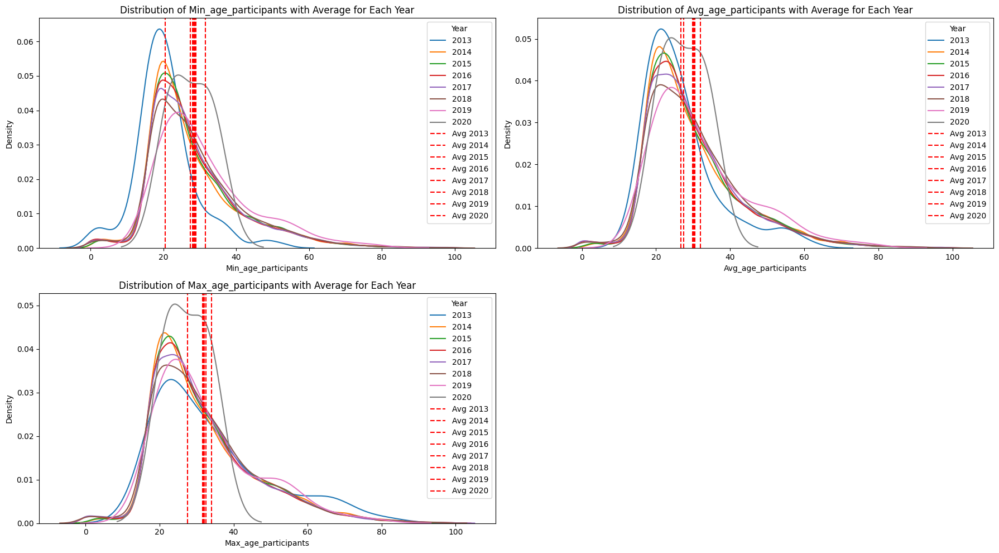

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


df_cleaned = clean_df_incidents.dropna(subset=['min_age_participants', 'avg_age_participants', 'max_age_participants']).copy()

df_cleaned['min_age_participants'] = df_cleaned['min_age_participants'].astype(float)
df_cleaned['avg_age_participants'] = df_cleaned['avg_age_participants'].astype(float)
df_cleaned['max_age_participants'] = df_cleaned['max_age_participants'].astype(float)


# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of age columns
age_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(2, 2, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[age_column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[age_column].mean()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='red', linestyle='--', label=f'Avg {year}')
        print(f'Average {age_column} for {year}: {average:.2f}')


    # Adding labels and title
    plt.xlabel(f'{age_column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {age_column.capitalize()} with Average for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

Median min_age_participants for 2013: 20.00
Median min_age_participants for 2014: 24.00
Median min_age_participants for 2015: 25.00
Median min_age_participants for 2016: 25.00
Median min_age_participants for 2017: 26.00
Median min_age_participants for 2018: 26.00
Median min_age_participants for 2019: 27.00
Median min_age_participants for 2020: 27.00
Median avg_age_participants for 2013: 24.00
Median avg_age_participants for 2014: 26.00
Median avg_age_participants for 2015: 27.00
Median avg_age_participants for 2016: 27.00
Median avg_age_participants for 2017: 27.00
Median avg_age_participants for 2018: 28.00
Median avg_age_participants for 2019: 28.00
Median avg_age_participants for 2020: 27.00
Median max_age_participants for 2013: 29.00
Median max_age_participants for 2014: 28.00
Median max_age_participants for 2015: 28.00
Median max_age_participants for 2016: 28.00
Median max_age_participants for 2017: 28.00
Median max_age_participants for 2018: 29.00
Median max_age_participants for 

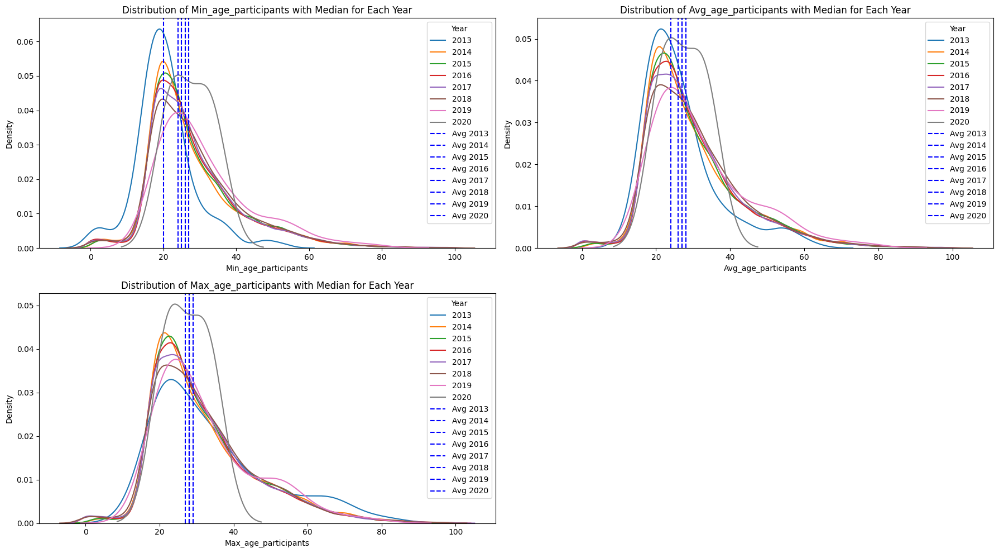

In [ ]:
df_cleaned = clean_df_incidents.dropna(subset=['min_age_participants', 'avg_age_participants', 'max_age_participants']).copy()

df_cleaned['min_age_participants'] = df_cleaned['min_age_participants'].astype(float)
df_cleaned['avg_age_participants'] = df_cleaned['avg_age_participants'].astype(float)
df_cleaned['max_age_participants'] = df_cleaned['max_age_participants'].astype(float)

# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of age columns
age_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(2, 2, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[age_column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[age_column].median()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='blue', linestyle='--', label=f'Avg {year}')
        print(f'Median {age_column} for {year}: {average:.2f}')


    # Adding labels and title
    plt.xlabel(f'{age_column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {age_column.capitalize()} with Median for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

Mean for Illinois (min_age_participants): 26.02
Mean for Delaware (min_age_participants): 26.33
Mean for Rhode Island (min_age_participants): 26.47
Mean for Massachusetts (min_age_participants): 26.86
Mean for District of Columbia (min_age_participants): 26.97
Mean for New Jersey (min_age_participants): 27.20
Mean for Tennessee (min_age_participants): 27.49
Mean for Virginia (min_age_participants): 27.74
Mean for Louisiana (min_age_participants): 27.79
Mean for Iowa (min_age_participants): 27.83
Mean for Nebraska (min_age_participants): 27.88
Mean for Ohio (min_age_participants): 27.90
Mean for Georgia (min_age_participants): 27.91
Mean for Maryland (min_age_participants): 28.02
Mean for New York (min_age_participants): 28.28
Mean for North Carolina (min_age_participants): 28.28
Mean for Wisconsin (min_age_participants): 28.34
Mean for Pennsylvania (min_age_participants): 28.45
Mean for Missouri (min_age_participants): 28.48
Mean for Michigan (min_age_participants): 28.53
Mean for Sout

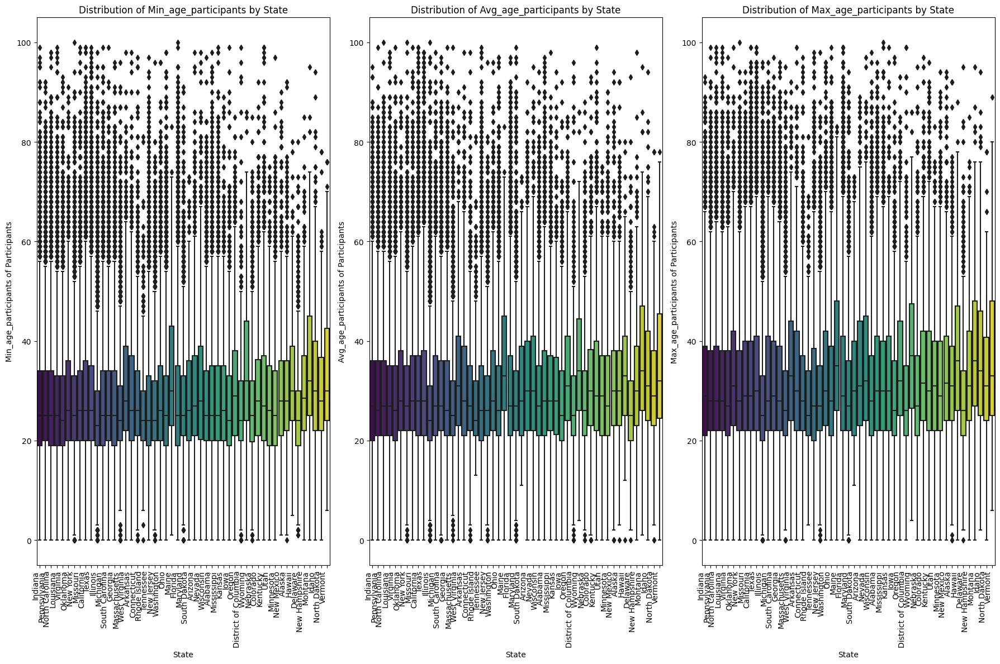

In [ ]:

df_cleaned = clean_df_incidents.dropna(subset=['min_age_participants', 'avg_age_participants', 'max_age_participants']).copy()

df_cleaned['min_age_participants'] = df_cleaned['min_age_participants'].astype(float)
df_cleaned['avg_age_participants'] = df_cleaned['avg_age_participants'].astype(float)
df_cleaned['max_age_participants'] = df_cleaned['max_age_participants'].astype(float)

# Calculate the average for each age column by state
avg_by_state = df_cleaned.groupby('state').agg({
    'min_age_participants': 'mean',
    'avg_age_participants': 'mean',
    'max_age_participants': 'mean'
}).sort_values(by='min_age_participants')

# Plotting the box plots side by side
plt.figure(figsize=(18, 12))

# List of age columns
age_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(1, 3, i)
    sns.boxplot(x='state', y=age_column, data=df_cleaned, palette='viridis')

    # Adding labels and title
    plt.xlabel('State')
    plt.ylabel(f'{age_column.capitalize()} of Participants')
    plt.title(f'Distribution of {age_column.capitalize()} by State')

    plt.xticks(rotation=90, ha='right')

    # Print the mean for each state
    for i, state in enumerate(avg_by_state.index):
        mean_value = avg_by_state.loc[state, age_column]
        print(f'Mean for {state} ({age_column}): {mean_value:.2f}')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

Median for Illinois (min_age_participants): 23.00
Median for New Jersey (min_age_participants): 24.00
Median for Iowa (min_age_participants): 24.00
Median for Rhode Island (min_age_participants): 24.00
Median for Massachusetts (min_age_participants): 24.00
Median for Delaware (min_age_participants): 24.00
Median for District of Columbia (min_age_participants): 24.00
Median for Tennessee (min_age_participants): 24.00
Median for Virginia (min_age_participants): 24.00
Median for Ohio (min_age_participants): 25.00
Median for Minnesota (min_age_participants): 25.00
Median for Michigan (min_age_participants): 25.00
Median for Wisconsin (min_age_participants): 25.00
Median for North Carolina (min_age_participants): 25.00
Median for Maryland (min_age_participants): 25.00
Median for Nebraska (min_age_participants): 25.00
Median for Mississippi (min_age_participants): 25.00
Median for Louisiana (min_age_participants): 25.00
Median for Alabama (min_age_participants): 25.00
Median for Pennsylvania

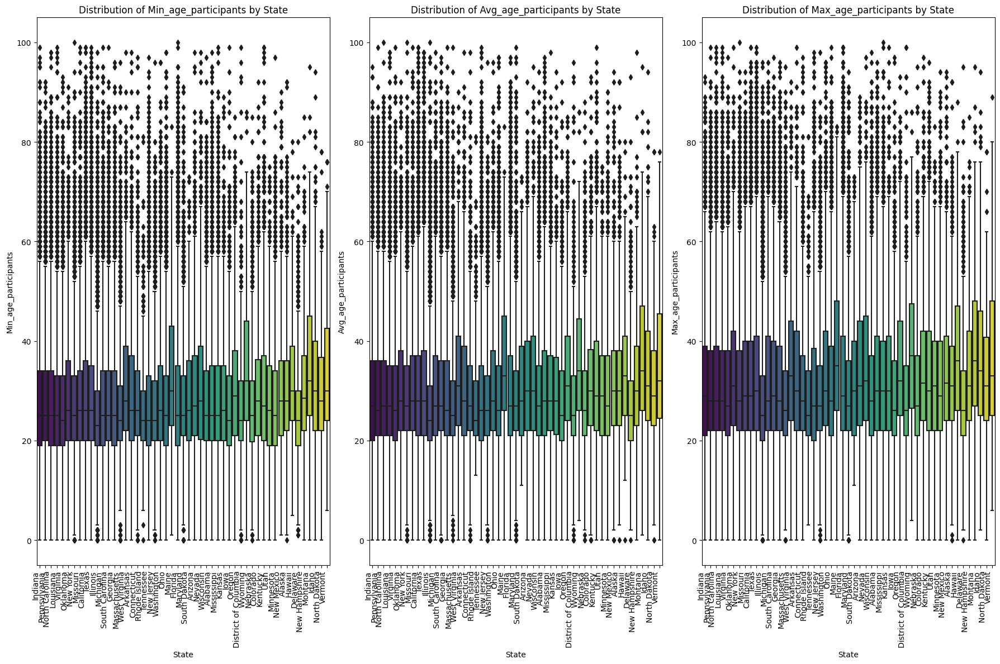

In [ ]:
df_cleaned = clean_df_incidents.dropna(subset=['min_age_participants', 'avg_age_participants', 'max_age_participants']).copy()

df_cleaned['min_age_participants'] = df_cleaned['min_age_participants'].astype(float)
df_cleaned['avg_age_participants'] = df_cleaned['avg_age_participants'].astype(float)
df_cleaned['max_age_participants'] = df_cleaned['max_age_participants'].astype(float)

# Calculate the median for each age column by state
median_by_state = df_cleaned.groupby('state').agg({
    'min_age_participants': 'median',
    'avg_age_participants': 'median',
    'max_age_participants': 'median'
}).sort_values(by='min_age_participants')

# Plotting the box plots side by side
plt.figure(figsize=(18, 12))

# List of age columns
age_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(1, 3, i)
    sns.boxplot(x='state', y=age_column, data=df_cleaned, palette='viridis')

    # Adding labels and title
    plt.xlabel('State')
    plt.ylabel(f'{age_column.capitalize()}')
    plt.title(f'Distribution of {age_column.capitalize()} by State')

    plt.xticks(rotation=90, ha='right')

    # Print the median for each state
    for i, state in enumerate(median_by_state.index):
        median_value = median_by_state.loc[state, age_column]
        print(f'Median for {state} ({age_column}): {median_value:.2f}')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

In [ ]:
df_cleaned['state'] = clean_df_incidents['state'].copy()

median_by_state_year_min = df_cleaned.groupby(['state', 'year'])['min_age_participants'].median().reset_index()

# Calculate median for 'avg_age_participants'
median_by_state_year_avg = df_cleaned.groupby(['state', 'year'])['avg_age_participants'].median().reset_index()

# Calculate median for 'max_age_participants'
median_by_state_year_max = df_cleaned.groupby(['state', 'year'])['max_age_participants'].median().reset_index()


In [ ]:
median_by_state_year_min['min_age_participants'] = median_by_state_year_min['min_age_participants'].astype('Float64')
median_by_state_year_min['min_age_participants'] = median_by_state_year_min['min_age_participants'].astype('Int64')
median_by_state_year_avg['avg_age_participants'] = median_by_state_year_avg['avg_age_participants'].astype('Float64')
median_by_state_year_avg['avg_age_participants'] = median_by_state_year_avg['avg_age_participants'].astype('Int64')
median_by_state_year_max['max_age_participants'] = median_by_state_year_max['max_age_participants'].astype('Float64')
median_by_state_year_max['max_age_participants'] = median_by_state_year_max['max_age_participants'].astype('Int64')

In [ ]:
medians_ages = pd.merge(median_by_state_year_min, median_by_state_year_avg, on=['state', 'year'])
medians_ages = pd.merge(medians_ages, median_by_state_year_max, on=['state', 'year'])
medians_ages.head(100)


,state,year,min_age_participants,avg_age_participants,max_age_participants
0,Alabama,2013,21,22,23
1,Alabama,2014,24,27,29
2,Alabama,2015,25,28,30
3,Alabama,2016,26,28,30
4,Alabama,2017,25,28,30
5,Alabama,2018,24,26,28
6,Alabama,2019,33,33,33
7,Alaska,2014,26,28,29
8,Alaska,2015,27,29,31
9,Alaska,2016,29,30,31


I EXTEND THE PREVIOUS DATAFRAME WITH THE MISSING YEARS FOR EACH STATE USING THE SAME VALUE OF THE MOST RECENT RECORD FOR THAT STATE

In [ ]:
# Create a reference DataFrame with all combinations of states and years
all_states = medians_ages['state'].unique()
all_years = range(medians_ages['year'].min(), medians_ages['year'].max() + 1)

ref_df = pd.DataFrame([(state, year) for state in all_states for year in all_years],
                      columns=['state', 'year'])

# Merge the reference DataFrame with your existing DataFrame
merged_df = pd.merge(ref_df, medians_ages, on=['state', 'year'], how='left')

# Forward-fill missing values within each state
merged_df_filled = merged_df.groupby('state').apply(lambda group: group.ffill())

# If there are still NaN values in the minimum year, fill them with the values from the next available year
merged_df_filled['min_age_participants'] = merged_df_filled.groupby('state')['min_age_participants'].bfill()
merged_df_filled['avg_age_participants'] = merged_df_filled.groupby('state')['avg_age_participants'].bfill()
merged_df_filled['max_age_participants'] = merged_df_filled.groupby('state')['max_age_participants'].bfill()


# Reset the index to get a clean DataFrame
merged_df_filled = merged_df_filled.reset_index(drop=True)


<ipython-input-994-4fa1f2e9df64>:12: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



In [ ]:
medians_merged = merged_df_filled.copy()

In [ ]:
prova = clean_df_incidents.copy()

In [ ]:
prova['min_age_participants'] = prova['min_age_participants'].replace(0, np.nan)
prova['avg_age_participants'] = prova['avg_age_participants'].replace(0, np.nan)
prova['max_age_participants'] = prova['max_age_participants'].replace(0, np.nan)

In [ ]:
merged_df = pd.merge(prova, medians_merged, on=['state', 'year'], how='left', suffixes=('_prova', '_medians'))

# Define a function to fill NaN values in prova using values from medians_merged
def fill_age_nans(row, col_name):
    if pd.isna(row[col_name + '_prova']):
        return row[col_name + '_medians']
    else:
        return row[col_name + '_prova']

# Fill NaN values in 'min_age_participants', 'avg_age_participants', and 'max_age_participants'
merged_df['min_age_participants'] = merged_df.apply(lambda row: fill_age_nans(row, 'min_age_participants'), axis=1)
merged_df['avg_age_participants'] = merged_df.apply(lambda row: fill_age_nans(row, 'avg_age_participants'), axis=1)
merged_df['max_age_participants'] = merged_df.apply(lambda row: fill_age_nans(row, 'max_age_participants'), axis=1)

# Reorder columns
desired_order = ['year', 'month', 'state', 'city_or_county', 'congressional_district',
                 'min_age_participants', 'avg_age_participants', 'max_age_participants',
                 'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                 'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested',
                 'n_unharmed', 'n_participants', 'incident_characteristics1', 'incident_characteristics2']

merged_df = merged_df[desired_order]

# Drop the unnecessary columns from the merged dataframe
#merged_df = merged_df.drop(['min_age_participants_prova', 'avg_age_participants_prova', 'max_age_participants_prova', 'min_age_participants_medians', 'avg_age_participants_medians', 'max_age_participants_medians'], axis=1)

# Now, merged_df contains the filled values for 'min_age_participants', 'avg_age_participants', and 'max_age_participants' based on the 'state' and 'year' combination

# If you want, you can assign it back to prova
prova = merged_df

In [ ]:
prova.sort_values(['state', 'year'], inplace=True)
medians_merged.sort_values(['state', 'year'], inplace=True)

<ipython-input-999-b154a0fb1909>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
medians_merged.head(10)

,state,year,min_age_participants,avg_age_participants,max_age_participants
0,Alabama,2013,21,22,23
1,Alabama,2014,24,27,29
2,Alabama,2015,25,28,30
3,Alabama,2016,26,28,30
4,Alabama,2017,25,28,30
5,Alabama,2018,24,26,28
6,Alabama,2019,33,33,33
7,Alabama,2020,33,33,33
8,Alaska,2013,26,28,29
9,Alaska,2014,26,28,29


In [ ]:
prova.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
161657,2013,12,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
167068,2013,7,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
517,2014,6,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
983,2014,7,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1083,2014,5,Alabama,Huntsville,5.0,24,27,29,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
1368,2014,7,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
1821,2014,5,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
1865,2014,9,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
2661,2014,4,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
2838,2014,5,Alabama,Mobile,1.0,24,27,29,<NA>,<NA>,<NA>,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


In [ ]:
#prova.sort_values(by=['state','min_age_participants'],na_position='first').head(100)

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(prova.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

**N_PARTICIPANTS CHILD/TEEN/ADULT**




In [ ]:
clean_df_incidents = prova.copy()

In [ ]:
clean_df_incidents.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
161657,2013,12,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
167068,2013,7,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
517,2014,6,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
983,2014,7,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1083,2014,5,Alabama,Huntsville,5.0,24,27,29,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
1368,2014,7,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
1821,2014,5,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
1865,2014,9,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
2661,2014,4,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
2838,2014,5,Alabama,Mobile,1.0,24,27,29,<NA>,<NA>,<NA>,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import pandas as pd

df_cleaned_child = clean_df_incidents.dropna(subset=['n_participants_child'])
df_cleaned_teen = clean_df_incidents.dropna(subset=['n_participants_teen'])
df_cleaned_adult = clean_df_incidents.dropna(subset=['n_participants_adult'])

# Create subplots
fig = make_subplots(rows=1, cols=3, subplot_titles=['n_participants_child','n_participants_teen','n_participants_adult'])

# Plotting the distribution with histogram and KDE for min_age_participants
histogram_child = px.histogram(df_cleaned_child, x='n_participants_child', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_child['data'][0], row=1, col=1)

# Plotting the distribution with histogram and KDE for avg_age_participants
histogram_teen = px.histogram(df_cleaned_teen, x='n_participants_teen', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_teen['data'][0], row=1, col=2)

# Plotting the distribution with histogram and KDE for max_age_participants
histogram_adult = px.histogram(df_cleaned_adult, x='n_participants_adult', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_adult['data'][0], row=1, col=3)

# Update layout
fig.update_layout(title_text='Distribution of Category of Participants (FULL DATASET)', showlegend=False)

# Display the subplot
fig.show()

In [ ]:
print(clean_df_incidents['n_participants_child'].value_counts())
print(clean_df_incidents['n_participants_teen'].value_counts())
print(clean_df_incidents['n_participants_adult'].value_counts())

0     193853
1       3045
2        536
3         84
4         23
5         10
6          4
7          2
8          1
11         1
Name: n_participants_child, dtype: Int64
0     178226
1      14893
2       3227
3        811
4        279
5         82
6         30
7          6
9          3
10         1
8          1
27         1
15         1
Name: n_participants_teen, dtype: Int64
1      106461
2       54412
3       15946
0       11545
4        5818
5        2060
6         733
7         293
8         121
9          48
10         35
11         20
12         13
13         10
15          6
18          5
16          5
20          3
14          3
22          3
17          3
29          3
24          2
19          2
21          2
32          1
33          1
103         1
63          1
27          1
30          1
25          1
28          1
Name: n_participants_adult, dtype: Int64


Average n_participants_child for 2013: 0.13
Average n_participants_child for 2014: 0.04
Average n_participants_child for 2015: 0.03
Average n_participants_child for 2016: 0.02
Average n_participants_child for 2017: 0.02
Average n_participants_child for 2018: 0.02
Average n_participants_child for 2019: 0.01
Average n_participants_child for 2020: 0.01
Average n_participants_teen for 2013: 0.59
Average n_participants_teen for 2014: 0.16
Average n_participants_teen for 2015: 0.15
Average n_participants_teen for 2016: 0.13
Average n_participants_teen for 2017: 0.13
Average n_participants_teen for 2018: 0.14
Average n_participants_teen for 2019: 0.04
Average n_participants_teen for 2020: 0.05
Average n_participants_adult for 2013: 4.23
Average n_participants_adult for 2014: 1.71
Average n_participants_adult for 2015: 1.55
Average n_participants_adult for 2016: 1.53
Average n_participants_adult for 2017: 1.46
Average n_participants_adult for 2018: 1.44
Average n_participants_adult for 2019: 1

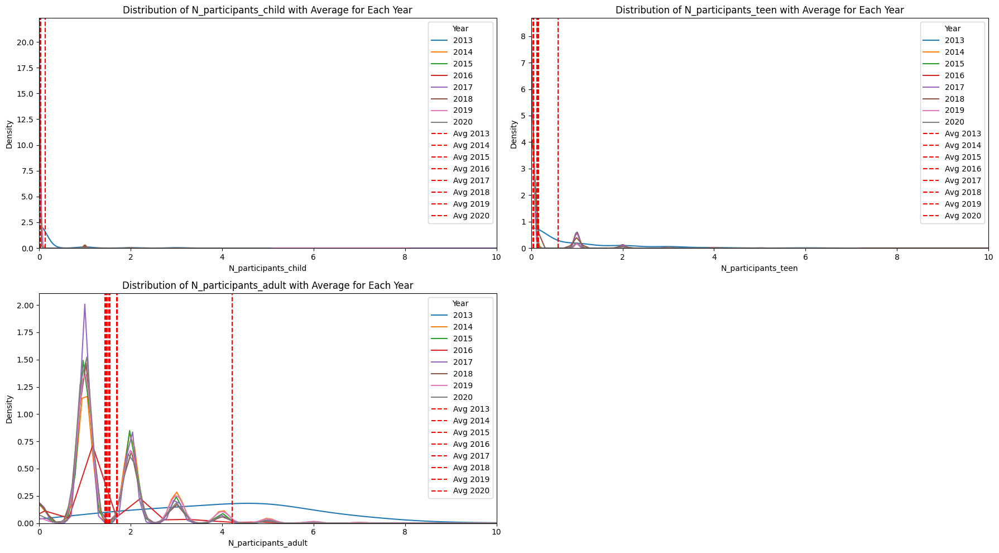

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


df_cleaned = clean_df_incidents.dropna(subset=['n_participants_child','n_participants_teen','n_participants_adult']).copy()

df_cleaned['n_participants_child'] = df_cleaned['n_participants_child'].astype(float)
df_cleaned['n_participants_teen'] = df_cleaned['n_participants_teen'].astype(float)
df_cleaned['n_participants_adult'] = df_cleaned['n_participants_adult'].astype(float)


# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of age columns
age_columns = ['n_participants_child','n_participants_teen','n_participants_adult']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(2, 2, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[age_column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[age_column].mean()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='red', linestyle='--', label=f'Avg {year}')
        print(f'Average {age_column} for {year}: {average:.2f}')

    plt.xlim(0, 10)

    # Adding labels and title
    plt.xlabel(f'{age_column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {age_column.capitalize()} with Average for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

Median n_participants_child for 2013: 0.00
Median n_participants_child for 2014: 0.00
Median n_participants_child for 2015: 0.00
Median n_participants_child for 2016: 0.00
Median n_participants_child for 2017: 0.00
Median n_participants_child for 2018: 0.00
Median n_participants_child for 2019: 0.00
Median n_participants_child for 2020: 0.00
Median n_participants_teen for 2013: 0.00
Median n_participants_teen for 2014: 0.00
Median n_participants_teen for 2015: 0.00
Median n_participants_teen for 2016: 0.00
Median n_participants_teen for 2017: 0.00
Median n_participants_teen for 2018: 0.00
Median n_participants_teen for 2019: 0.00
Median n_participants_teen for 2020: 0.00
Median n_participants_adult for 2013: 4.00
Median n_participants_adult for 2014: 1.00
Median n_participants_adult for 2015: 1.00
Median n_participants_adult for 2016: 1.00
Median n_participants_adult for 2017: 1.00
Median n_participants_adult for 2018: 1.00
Median n_participants_adult for 2019: 1.00
Median n_participan

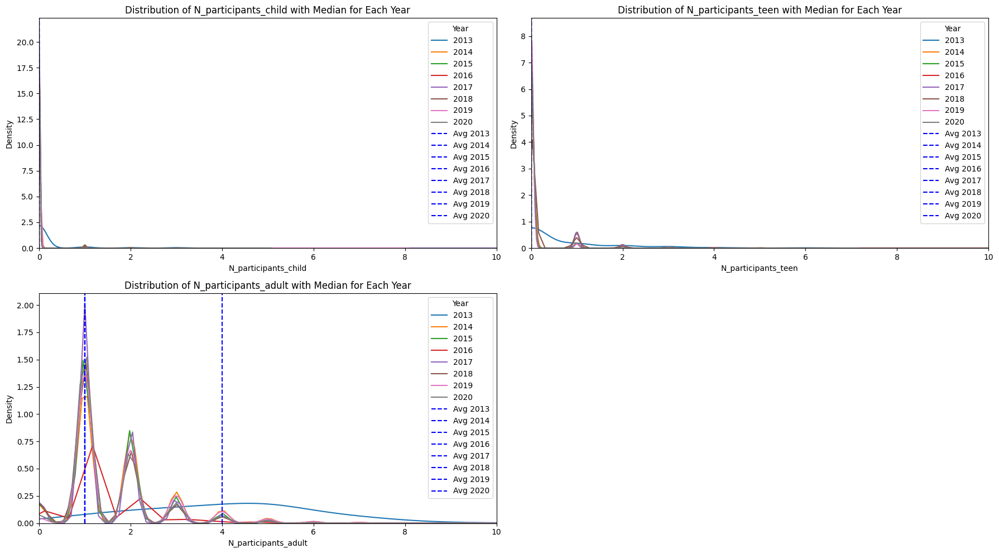

In [ ]:

df_cleaned = clean_df_incidents.dropna(subset=['n_participants_child','n_participants_teen','n_participants_adult']).copy()

df_cleaned['n_participants_child'] = df_cleaned['n_participants_child'].astype(float)
df_cleaned['n_participants_teen'] = df_cleaned['n_participants_teen'].astype(float)
df_cleaned['n_participants_adult'] = df_cleaned['n_participants_adult'].astype(float)

# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of age columns
age_columns = ['n_participants_child','n_participants_teen','n_participants_adult']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(2, 2, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[age_column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[age_column].median()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='blue', linestyle='--', label=f'Avg {year}')
        print(f'Median {age_column} for {year}: {average:.2f}')

    plt.xlim(0, 10)
    # Adding labels and title
    plt.xlabel(f'{age_column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {age_column.capitalize()} with Median for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

In [ ]:
df_cleaned['state'] = clean_df_incidents['state'].copy()

median_by_state_year_child = df_cleaned.groupby(['state', 'year'])['n_participants_child'].median().reset_index()

median_by_state_year_teen = df_cleaned.groupby(['state', 'year'])['n_participants_teen'].median().reset_index()

median_by_state_year_adult = df_cleaned.groupby(['state', 'year'])['n_participants_adult'].median().reset_index()


In [ ]:
median_by_state_year_child['n_participants_child'] = median_by_state_year_child['n_participants_child'].astype('Float64')
median_by_state_year_child['n_participants_child'] = median_by_state_year_child['n_participants_child'].astype('Int64')

median_by_state_year_teen['n_participants_teen'] = median_by_state_year_teen['n_participants_teen'].astype('Float64')
median_by_state_year_teen['n_participants_teen'] = median_by_state_year_teen['n_participants_teen'].astype('Int64')

median_by_state_year_adult['n_participants_adult'] = median_by_state_year_adult['n_participants_adult'].astype('Float64')
median_by_state_year_adult['n_participants_adult'] = median_by_state_year_adult['n_participants_adult'].astype('Int64')

In [ ]:
medians_category = pd.merge(median_by_state_year_child, median_by_state_year_teen, on=['state', 'year'])
medians_category = pd.merge(medians_category, median_by_state_year_adult, on=['state', 'year'])
medians_category.head(100)


,state,year,n_participants_child,n_participants_teen,n_participants_adult
0,Alabama,2013,0,0,5
1,Alabama,2014,0,0,2
2,Alabama,2015,0,0,2
3,Alabama,2016,0,0,1
4,Alabama,2017,0,0,1
5,Alabama,2018,0,0,1
6,Alabama,2019,0,0,2
7,Alabama,2020,0,0,1
8,Alaska,2014,0,0,1
9,Alaska,2015,0,0,1


In [ ]:
# Create a reference DataFrame with all combinations of states and years
all_states = medians_category['state'].unique()
all_years = range(medians_category['year'].min(), medians_category['year'].max() + 1)

ref_df = pd.DataFrame([(state, year) for state in all_states for year in all_years],
                      columns=['state', 'year'])

# Merge the reference DataFrame with your existing DataFrame
merged_df = pd.merge(ref_df, medians_category, on=['state', 'year'], how='left')

# Forward-fill missing values within each state
merged_df_filled = merged_df.groupby('state').apply(lambda group: group.ffill())

# If there are still NaN values in the minimum year, fill them with the values from the next available year
merged_df_filled['n_participants_child'] = merged_df_filled.groupby('state')['n_participants_child'].bfill()
merged_df_filled['n_participants_teen'] = merged_df_filled.groupby('state')['n_participants_teen'].bfill()
merged_df_filled['n_participants_adult'] = merged_df_filled.groupby('state')['n_participants_adult'].bfill()


# Reset the index to get a clean DataFrame
merged_df_filled = merged_df_filled.reset_index(drop=True)


<ipython-input-1013-da16656a91f3>:12: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



In [ ]:
medians_categories = merged_df_filled.copy()
prova = clean_df_incidents.copy()

In [ ]:
medians_categories.head(10)

,state,year,n_participants_child,n_participants_teen,n_participants_adult
0,Alabama,2013,0,0,5
1,Alabama,2014,0,0,2
2,Alabama,2015,0,0,2
3,Alabama,2016,0,0,1
4,Alabama,2017,0,0,1
5,Alabama,2018,0,0,1
6,Alabama,2019,0,0,2
7,Alabama,2020,0,0,1
8,Alaska,2013,0,0,1
9,Alaska,2014,0,0,1


In [ ]:
prova.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
161657,2013,12,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
167068,2013,7,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
517,2014,6,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
983,2014,7,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1083,2014,5,Alabama,Huntsville,5.0,24,27,29,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
1368,2014,7,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
1821,2014,5,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
1865,2014,9,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
2661,2014,4,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
2838,2014,5,Alabama,Mobile,1.0,24,27,29,<NA>,<NA>,<NA>,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


In [ ]:
merged_df = pd.merge(prova, medians_categories, on=['state', 'year'], how='left', suffixes=('_prova', '_medians'))

# Define a function to fill NaN values in prova using values from medians_merged
def fill_category_nans(row, col_name):
    if pd.isna(row[col_name + '_prova']):
        return row[col_name + '_medians']
    else:
        return row[col_name + '_prova']

# Fill NaN values in 'min_age_participants', 'avg_age_participants', and 'max_age_participants'
merged_df['n_participants_child'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_participants_child'), axis=1)
merged_df['n_participants_teen'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_participants_teen'), axis=1)
merged_df['n_participants_adult'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_participants_adult'), axis=1)

# Reorder columns
desired_order = ['year', 'month', 'state', 'city_or_county', 'congressional_district',
                 'min_age_participants', 'avg_age_participants', 'max_age_participants',
                 'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                 'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested',
                 'n_unharmed', 'n_participants', 'incident_characteristics1', 'incident_characteristics2']

merged_df = merged_df[desired_order]

# Drop the unnecessary columns from the merged dataframe
#merged_df = merged_df.drop(['min_age_participants_prova', 'avg_age_participants_prova', 'max_age_participants_prova', 'min_age_participants_medians', 'avg_age_participants_medians', 'max_age_participants_medians'], axis=1)

# Now, merged_df contains the filled values for 'min_age_participants', 'avg_age_participants', and 'max_age_participants' based on the 'state' and 'year' combination

# If you want, you can assign it back to prova
prova = merged_df

In [ ]:
prova.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2013,12,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1,2013,7,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
2,2014,6,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2014,7,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
4,2014,5,Alabama,Huntsville,5.0,24,27,29,0,0,2,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
5,2014,7,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
6,2014,5,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
7,2014,9,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
8,2014,4,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
9,2014,5,Alabama,Mobile,1.0,24,27,29,0,0,2,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(prova.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

**CLEANING n_males	n_females	n_killed	n_injured	n_arrested	n_unharmed	n_participants**

In [ ]:
clean_df_incidents = ciao.copy()

In [ ]:
#ciao = clean_df_incidents.copy()

In [ ]:
clean_df_incidents.to_csv('/content/drive/MyDrive/' + 'cleaning_incidents.csv', index=False)


In [ ]:
df_cleaned_males = clean_df_incidents.dropna(subset=['n_males'])
df_cleaned_females = clean_df_incidents.dropna(subset=['n_females'])
df_cleaned_killed = clean_df_incidents.dropna(subset=['n_killed'])
df_cleaned_injured = clean_df_incidents.dropna(subset=['n_injured'])
df_cleaned_arrested = clean_df_incidents.dropna(subset=['n_arrested'])
df_cleaned_unharmed = clean_df_incidents.dropna(subset=['n_unharmed'])
df_cleaned_participants = clean_df_incidents.dropna(subset=['n_participants'])

# Create subplots
fig = make_subplots(rows=1, cols=7, subplot_titles=['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants'])

# Plotting the distribution with histogram and KDE for each column
histogram_males = px.histogram(df_cleaned_males, x='n_males', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_males['data'][0], row=1, col=1)

histogram_females = px.histogram(df_cleaned_females, x='n_females', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_females['data'][0], row=1, col=2)

histogram_killed = px.histogram(df_cleaned_killed, x='n_killed', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_killed['data'][0], row=1, col=3)

histogram_injured = px.histogram(df_cleaned_injured, x='n_injured', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_injured['data'][0], row=1, col=4)

histogram_arrested = px.histogram(df_cleaned_arrested, x='n_arrested', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_arrested['data'][0], row=1, col=5)

histogram_unharmed = px.histogram(df_cleaned_unharmed, x='n_unharmed', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_unharmed['data'][0], row=1, col=6)

histogram_participants = px.histogram(df_cleaned_participants, x='n_participants', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_participants['data'][0], row=1, col=7)

# Update layout
fig.update_layout(title_text='Distribution of Various Participant Counts (FULL DATASET)', showlegend=False)

# Display the subplot
fig.show()

Average n_males for 2013: 3.73
Average n_males for 2014: 1.64
Average n_males for 2015: 1.55
Average n_males for 2016: 1.51
Average n_males for 2017: 1.46
Average n_males for 2018: 1.44
Average n_males for 2019: 1.52
Average n_males for 2020: 1.41
Average n_females for 2013: 1.14
Average n_females for 2014: 0.26
Average n_females for 2015: 0.23
Average n_females for 2016: 0.21
Average n_females for 2017: 0.19
Average n_females for 2018: 0.20
Average n_females for 2019: 0.18
Average n_females for 2020: 0.18
Average n_killed for 2013: 1.32
Average n_killed for 2014: 0.36
Average n_killed for 2015: 0.33
Average n_killed for 2016: 0.30
Average n_killed for 2017: 0.30
Average n_killed for 2018: 0.31
Average n_killed for 2019: 0.11
Average n_killed for 2020: 0.14
Average n_injured for 2013: 3.38
Average n_injured for 2014: 0.49
Average n_injured for 2015: 0.53
Average n_injured for 2016: 0.56
Average n_injured for 2017: 0.55
Average n_injured for 2018: 0.51
Average n_injured for 2019: 0.48
A

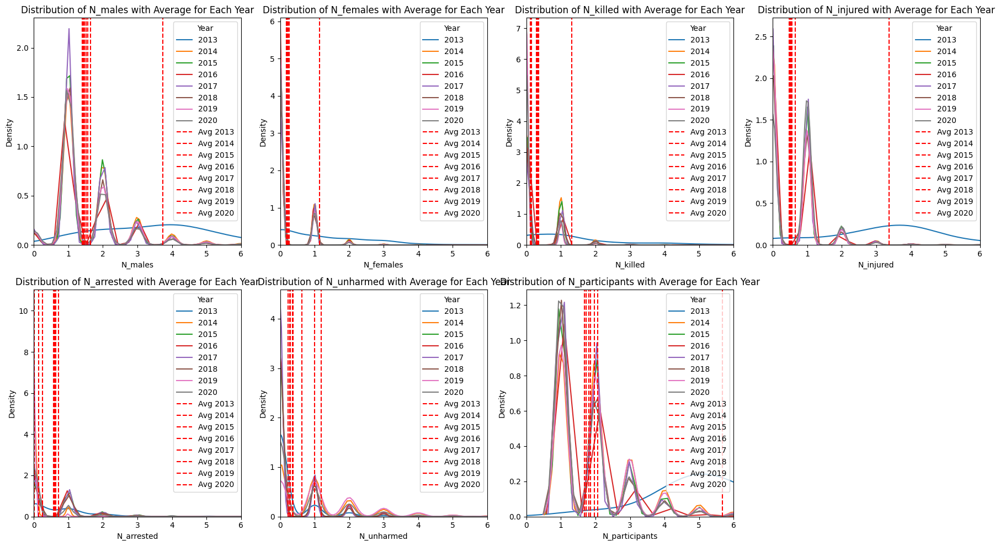

In [ ]:
df_cleaned = clean_df_incidents.dropna(subset=['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants']).copy()

df_cleaned['n_males'] = df_cleaned['n_males'].astype(float)
df_cleaned['n_females'] = df_cleaned['n_females'].astype(float)
df_cleaned['n_killed'] = df_cleaned['n_killed'].astype(float)
df_cleaned['n_injured'] = df_cleaned['n_injured'].astype(float)
df_cleaned['n_arrested'] = df_cleaned['n_arrested'].astype(float)
df_cleaned['n_unharmed'] = df_cleaned['n_unharmed'].astype(float)
df_cleaned['n_participants'] = df_cleaned['n_participants'].astype(float)


# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of columns
columns_to_plot = ['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants']

for i, column in enumerate(columns_to_plot, start=1):
    plt.subplot(2, 4, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[column].mean()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='red', linestyle='--', label=f'Avg {year}')
        print(f'Average {column} for {year}: {average:.2f}')

    plt.xlim(0, 6)

    # Adding labels and title
    plt.xlabel(f'{column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {column.capitalize()} with Average for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

Average n_males for 2013: 4.00
Average n_males for 2014: 1.00
Average n_males for 2015: 1.00
Average n_males for 2016: 1.00
Average n_males for 2017: 1.00
Average n_males for 2018: 1.00
Average n_males for 2019: 1.00
Average n_males for 2020: 1.00
Average n_females for 2013: 1.00
Average n_females for 2014: 0.00
Average n_females for 2015: 0.00
Average n_females for 2016: 0.00
Average n_females for 2017: 0.00
Average n_females for 2018: 0.00
Average n_females for 2019: 0.00
Average n_females for 2020: 0.00
Average n_killed for 2013: 1.00
Average n_killed for 2014: 0.00
Average n_killed for 2015: 0.00
Average n_killed for 2016: 0.00
Average n_killed for 2017: 0.00
Average n_killed for 2018: 0.00
Average n_killed for 2019: 0.00
Average n_killed for 2020: 0.00
Average n_injured for 2013: 3.00
Average n_injured for 2014: 0.00
Average n_injured for 2015: 0.00
Average n_injured for 2016: 0.00
Average n_injured for 2017: 0.00
Average n_injured for 2018: 0.00
Average n_injured for 2019: 0.00
A

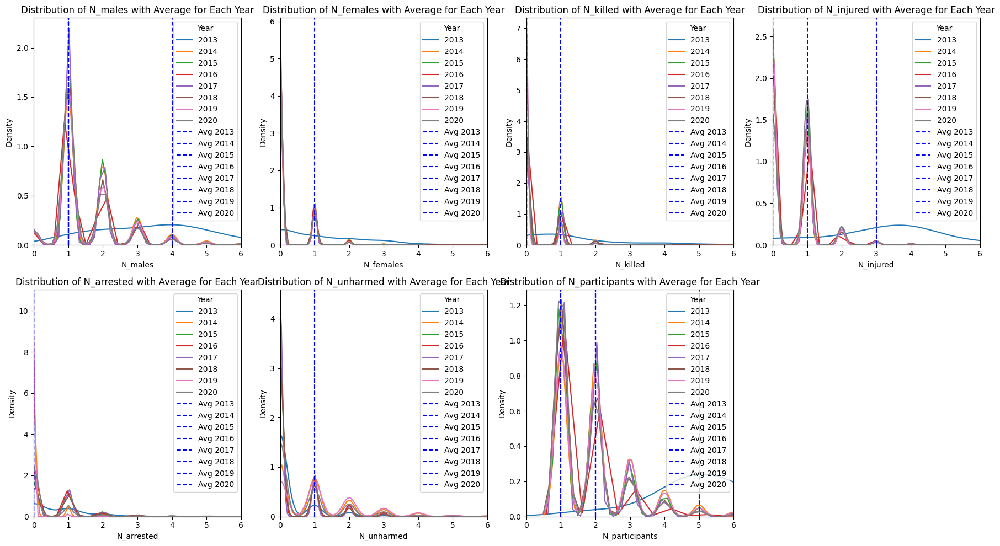

In [ ]:
df_cleaned = clean_df_incidents.dropna(subset=['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants']).copy()

df_cleaned['n_males'] = df_cleaned['n_males'].astype(float)
df_cleaned['n_females'] = df_cleaned['n_females'].astype(float)
df_cleaned['n_killed'] = df_cleaned['n_killed'].astype(float)
df_cleaned['n_injured'] = df_cleaned['n_injured'].astype(float)
df_cleaned['n_arrested'] = df_cleaned['n_arrested'].astype(float)
df_cleaned['n_unharmed'] = df_cleaned['n_unharmed'].astype(float)
df_cleaned['n_participants'] = df_cleaned['n_participants'].astype(float)


# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of columns
columns_to_plot = ['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants']

for i, column in enumerate(columns_to_plot, start=1):
    plt.subplot(2, 4, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[column].median()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='blue', linestyle='--', label=f'Avg {year}')
        print(f'Average {column} for {year}: {average:.2f}')

    plt.xlim(0, 6)

    # Adding labels and title
    plt.xlabel(f'{column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {column.capitalize()} with Average for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

In [ ]:
df_cleaned['state'] = clean_df_incidents['state'].copy()

median_by_state_year_males = df_cleaned.groupby(['state', 'year'])['n_males'].median().reset_index()
median_by_state_year_females = df_cleaned.groupby(['state', 'year'])['n_females'].median().reset_index()
median_by_state_year_killed = df_cleaned.groupby(['state', 'year'])['n_killed'].median().reset_index()
median_by_state_year_injured = df_cleaned.groupby(['state', 'year'])['n_injured'].median().reset_index()
median_by_state_year_arrested = df_cleaned.groupby(['state', 'year'])['n_arrested'].median().reset_index()
median_by_state_year_unharmed = df_cleaned.groupby(['state', 'year'])['n_unharmed'].median().reset_index()
median_by_state_year_participants = df_cleaned.groupby(['state', 'year'])['n_participants'].median().reset_index()


In [ ]:
median_by_state_year_males['n_males'] = median_by_state_year_males['n_males'].astype('Float64')
median_by_state_year_males['n_males'] = median_by_state_year_males['n_males'].astype('Int64')

median_by_state_year_females['n_females'] = median_by_state_year_females['n_females'].astype('Float64')
median_by_state_year_females['n_females'] = median_by_state_year_females['n_females'].astype('Int64')

median_by_state_year_killed['n_killed'] = median_by_state_year_killed['n_killed'].astype('Float64')
median_by_state_year_killed['n_killed'] = median_by_state_year_killed['n_killed'].astype('Int64')

median_by_state_year_injured['n_injured'] = median_by_state_year_injured['n_injured'].astype('Float64')
median_by_state_year_injured['n_injured'] = median_by_state_year_injured['n_injured'].astype('Int64')

median_by_state_year_arrested['n_arrested'] = median_by_state_year_arrested['n_arrested'].astype('Float64')
median_by_state_year_arrested['n_arrested'] = median_by_state_year_arrested['n_arrested'].astype('Int64')

median_by_state_year_unharmed['n_unharmed'] = median_by_state_year_unharmed['n_unharmed'].astype('Float64')
median_by_state_year_unharmed['n_unharmed'] = median_by_state_year_unharmed['n_unharmed'].astype('Int64')

median_by_state_year_participants['n_participants'] = median_by_state_year_participants['n_participants'].astype('Float64')
median_by_state_year_participants['n_participants'] = median_by_state_year_participants['n_participants'].astype('Int64')

In [ ]:
medians = pd.merge(median_by_state_year_males, median_by_state_year_females, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_killed, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_injured, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_arrested, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_unharmed, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_participants, on=['state', 'year'])

# Display the merged DataFrame
medians.head(10)

,state,year,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants
0,Alabama,2013,4,1,1,4,1,0,7
1,Alabama,2014,2,0,0,0,0,1,2
2,Alabama,2015,1,0,0,0,0,0,2
3,Alabama,2016,1,0,0,0,0,0,2
4,Alabama,2017,1,0,0,1,0,0,2
5,Alabama,2018,1,0,0,1,0,0,2
6,Alabama,2019,1,0,0,0,0,1,2
7,Alabama,2020,1,0,0,1,0,0,1
8,Alaska,2014,1,0,0,0,0,0,1
9,Alaska,2015,1,0,0,0,1,0,2


In [ ]:
all_states = medians_category['state'].unique()
all_years = range(medians['year'].min(), medians['year'].max() + 1)

ref_df = pd.DataFrame([(state, year) for state in all_states for year in all_years],
                      columns=['state', 'year'])

# Merge the reference DataFrame with your existing DataFrame
merged_df = pd.merge(ref_df, medians, on=['state', 'year'], how='left')

# Forward-fill missing values within each state
merged_df_filled = merged_df.groupby('state').apply(lambda group: group.ffill())

# If there are still NaN values in the minimum year, fill them with the values from the next available year
merged_df_filled['n_males'] = merged_df_filled.groupby('state')['n_males'].bfill()
merged_df_filled['n_females'] = merged_df_filled.groupby('state')['n_females'].bfill()
merged_df_filled['n_killed'] = merged_df_filled.groupby('state')['n_killed'].bfill()
merged_df_filled['n_injured'] = merged_df_filled.groupby('state')['n_injured'].bfill()
merged_df_filled['n_arrested'] = merged_df_filled.groupby('state')['n_arrested'].bfill()
merged_df_filled['n_unharmed'] = merged_df_filled.groupby('state')['n_unharmed'].bfill()
merged_df_filled['n_participants'] = merged_df_filled.groupby('state')['n_participants'].bfill()

# Reset the index to get a clean DataFrame
merged_df_filled = merged_df_filled.reset_index(drop=True)

<ipython-input-1049-82acb1839ab6>:11: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



In [ ]:
medians_info = merged_df_filled.copy()
prova = clean_df_incidents.copy()

In [ ]:
medians_info.head(10)

,state,year,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants
0,Alabama,2013,4,1,1,4,1,0,7
1,Alabama,2014,2,0,0,0,0,1,2
2,Alabama,2015,1,0,0,0,0,0,2
3,Alabama,2016,1,0,0,0,0,0,2
4,Alabama,2017,1,0,0,1,0,0,2
5,Alabama,2018,1,0,0,1,0,0,2
6,Alabama,2019,1,0,0,0,0,1,2
7,Alabama,2020,1,0,0,1,0,0,1
8,Alaska,2013,1,0,0,0,0,0,1
9,Alaska,2014,1,0,0,0,0,0,1


In [ ]:
prova.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2013,12,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1,2013,7,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
2,2014,6,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2014,7,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
4,2014,5,Alabama,Huntsville,5.0,24,27,29,0,0,2,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
5,2014,7,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
6,2014,5,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
7,2014,9,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
8,2014,4,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
9,2014,5,Alabama,Mobile,1.0,24,27,29,0,0,2,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


In [ ]:
merged_df = pd.merge(prova, medians_info, on=['state', 'year'], how='left', suffixes=('_prova', '_medians'))

# Define a function to fill NaN values in prova using values from medians_categories
def fill_category_nans(row, col_name):
    if pd.isna(row[col_name + '_prova']):
        return row[col_name + '_medians']
    else:
        return row[col_name + '_prova']

# Fill NaN values in the specified columns
merged_df['n_males'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_males'), axis=1)
merged_df['n_females'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_females'), axis=1)
merged_df['n_killed'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_killed'), axis=1)
merged_df['n_injured'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_injured'), axis=1)
merged_df['n_arrested'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_arrested'), axis=1)
merged_df['n_unharmed'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_unharmed'), axis=1)
merged_df['n_participants'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_participants'), axis=1)

# Reorder columns
desired_order = ['year', 'month', 'state', 'city_or_county', 'congressional_district',
                 'min_age_participants',	'avg_age_participants',	'max_age_participants',
                 'n_participants_child',	'n_participants_teen',	'n_participants_adult',
                 'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested',
                 'n_unharmed', 'n_participants', 'incident_characteristics1', 'incident_characteristics2']

merged_df = merged_df[desired_order]

# Now, merged_df contains the filled values for the specified columns based on the 'state' and 'year' combination

# If you want, you can assign it back to prova
prova =  merged_df

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(prova.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

In [ ]:
clean_df_incidents = prova.copy()

In [ ]:
clean_df_incidents.to_csv('/content/drive/MyDrive/' + 'cleaning_incidents.csv', index=False)

In [ ]:
clean_df_incidents.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2013,12,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1,2013,7,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
2,2014,6,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2014,7,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
4,2014,5,Alabama,Huntsville,5.0,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN
5,2014,7,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
6,2014,5,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
7,2014,9,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
8,2014,4,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
9,2014,5,Alabama,Mobile,1.0,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN


**POVERTY DATASET**

In [ ]:
sorted_df_poverty = df_poverty.sort_values(by=['year','state'])
condition = (sorted_df_poverty['year'] >= 2013) & (sorted_df_poverty['year'] <= 2020)
clean_df_poverty = sorted_df_poverty[condition]
clean_df_poverty.head(10)

,state,year,povertyPercentage
365,Alabama,2013,17.5
366,Alaska,2013,10.2
367,Arizona,2013,18.7
368,Arkansas,2013,16.1
369,California,2013,14.9
370,Colorado,2013,11.0
371,Connecticut,2013,9.5
372,Delaware,2013,11.1
373,District of Columbia,2013,19.6
374,Florida,2013,15.9


In [ ]:
clean_df_poverty['state'] = clean_df_poverty['state'].str.upper()
clean_df_poverty.head(10)

<ipython-input-759-28e523dd479e>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,state,year,povertyPercentage
365,ALABAMA,2013,17.5
366,ALASKA,2013,10.2
367,ARIZONA,2013,18.7
368,ARKANSAS,2013,16.1
369,CALIFORNIA,2013,14.9
370,COLORADO,2013,11.0
371,CONNECTICUT,2013,9.5
372,DELAWARE,2013,11.1
373,DISTRICT OF COLUMBIA,2013,19.6
374,FLORIDA,2013,15.9


**ELECTIONS DATASET**

In [ ]:
sorted_df_districts = df_districts.sort_values(by=['year','state'])
condition = (sorted_df_districts['year'] >= 2012) & (sorted_df_districts['year'] <= 2020)
clean_df_districts = sorted_df_districts[condition]
clean_df_districts.tail(10)

,year,state,congressional_district,party,candidatevotes,totalvotes
9996,2020,WEST VIRGINIA,3,REPUBLICAN,161585,226668
9997,2020,WISCONSIN,1,REPUBLICAN,238271,401754
9998,2020,WISCONSIN,2,DEMOCRAT,318523,457205
9999,2020,WISCONSIN,3,DEMOCRAT,199870,389618
10000,2020,WISCONSIN,4,DEMOCRAT,232668,311697
10001,2020,WISCONSIN,5,REPUBLICAN,265434,441599
10002,2020,WISCONSIN,6,REPUBLICAN,238874,403333
10003,2020,WISCONSIN,7,REPUBLICAN,252048,415007
10004,2020,WISCONSIN,8,REPUBLICAN,268173,417838
10005,2020,WYOMING,0,REPUBLICAN,185732,278503


In [ ]:
# Creiamo una copia del DataFrame
clean_districts = clean_df_districts.copy()

# Riduci di 1 l'anno per la nuova riga
clean_districts['year'] = clean_districts['year'] + 1

# Concateniamo il DataFrame originale con la versione modificata
clean_districts = pd.concat([clean_df_districts, clean_districts])

# Ordiniamo il DataFrame risultante per 'year', 'state' e 'congressional_district'
clean_districts = clean_districts.sort_values(by=['year', 'state'])

# Ripristiniamo l'indice del DataFrame risultante
clean_districts = clean_districts.reset_index(drop=True)

condition = (clean_districts['year'] >= 2013) & (clean_districts['year'] <= 2020)
clean_districts = clean_districts[condition]
# DATAFRAME FINALE DEI DISTRETTI COMPLETO ANCHE CON GLI ANNI DISPARI
clean_districts.head(100)

,year,state,congressional_district,party,candidatevotes,totalvotes
435,2013,ALABAMA,1,REPUBLICAN,196374,200676
436,2013,ALABAMA,2,REPUBLICAN,180591,283953
437,2013,ALABAMA,3,REPUBLICAN,175306,273930
438,2013,ALABAMA,4,REPUBLICAN,199071,269118
439,2013,ALABAMA,5,REPUBLICAN,189185,291293
440,2013,ALABAMA,6,REPUBLICAN,219262,308102
441,2013,ALABAMA,7,DEMOCRAT,232520,306558
442,2013,ALASKA,0,REPUBLICAN,185296,289804
443,2013,ARIZONA,1,DEMOCRAT,122774,251595
444,2013,ARIZONA,2,DEMOCRAT,147338,292279


In [ ]:
clean_districts['party'] = clean_districts['party'].replace('DEMOCRATIC-FARMER-LABOR', 'DEMOCRAT')
clean_districts['party'].unique()

array(['REPUBLICAN', 'DEMOCRAT'], dtype=object)

ASSEGNO I VALORI AI VOTI MANCANTI IN BASE A INFORMAZIONI UFFICIALI RICAVATE:

2020 FLORIDA DISTRETTO 25 NESSUN VOTO REGISTRATO CAUSA 'UNCONTESTED' QUINDI NaN

https://en.wikipedia.org/wiki/2018_United_States_House_of_Representatives_elections_in_Florida#District_10



In [ ]:
updates = [
    (3592, np.nan, np.nan),
    (2285, 50822, 64845),
    (536, np.nan, np.nan),
    (545, np.nan, np.nan),
    (968, np.nan, np.nan),
    (970, np.nan, np.nan),
    (981, np.nan, np.nan),
    (983, np.nan, np.nan),
    (1416, np.nan, np.nan),
    (1418, np.nan, np.nan),
    (1403, np.nan, np.nan),
    (2706, 73601, 99135),
    (2710, np.nan, np.nan),
    (2717, np.nan, np.nan),
    (2720, 65894, 78727),
    (3141, 73601, 99135),
    (3145, np.nan, np.nan),
    (3152, np.nan, np.nan),
    (3155, 65894, 78727),
    (1405, np.nan, np.nan),
    (1184, np.nan, np.nan),
    (1619, np.nan, np.nan),
    (1850, 50822, 64845),
    (2054, 50595, 62655),
    (2489, 50595, 62655)
]

# Update the DataFrame using the list of tuples
for idx, candidatevotes, totalvotes in updates:
    clean_districts.at[idx, 'candidatevotes'] = candidatevotes
    clean_districts.at[idx, 'totalvotes'] = totalvotes

In [ ]:
clean_districts.sort_values(by=['candidatevotes','totalvotes'],na_position='first').head(18)

,year,state,congressional_district,party,candidatevotes,totalvotes
536,2013,FLORIDA,15,REPUBLICAN,NaN,NaN
545,2013,FLORIDA,24,DEMOCRAT,NaN,NaN
968,2014,FLORIDA,12,REPUBLICAN,NaN,NaN
970,2014,FLORIDA,14,DEMOCRAT,NaN,NaN
981,2014,FLORIDA,25,REPUBLICAN,NaN,NaN
983,2014,FLORIDA,27,REPUBLICAN,NaN,NaN
1184,2014,OKLAHOMA,1,REPUBLICAN,NaN,NaN
1403,2015,FLORIDA,12,REPUBLICAN,NaN,NaN
1405,2015,FLORIDA,14,DEMOCRAT,NaN,NaN
1416,2015,FLORIDA,25,REPUBLICAN,NaN,NaN


In [ ]:
clean_districts.to_csv('/content/drive/MyDrive/' + 'clean_districts.csv', index=False)

# MERGE

In [ ]:
clean_df_incidents = pd.read_csv('/content/drive/MyDrive/cleaning_incidents.csv')

In [ ]:
clean_df_incidents.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2013,12,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1,2013,7,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
2,2014,6,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2014,7,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
4,2014,5,Alabama,Huntsville,5.0,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN
5,2014,7,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
6,2014,5,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
7,2014,9,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
8,2014,4,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
9,2014,5,Alabama,Mobile,1.0,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN


In [ ]:
clean_df_incidents['state'] = clean_df_incidents['state'].str.upper()

In [ ]:
clean_districts['congressional_district'] = clean_districts['congressional_district'].astype('Int64')
clean_df_incidents['congressional_district'] = clean_df_incidents['congressional_district'].astype('Int64')

In [ ]:
merged_df = pd.merge(clean_df_incidents, clean_df_poverty, on=['year', 'state'], how='left')
final_dataset = pd.merge(merged_df, clean_districts, on=['year', 'state','congressional_district'], how='left')

In [ ]:
final_dataset['candidatevotes'] = final_dataset['candidatevotes'].astype('Int64')
final_dataset['totalvotes'] = final_dataset['totalvotes'].astype('Int64')
final_dataset.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,2013,12,ALABAMA,Montgomery,2,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,180591,283953
1,2013,7,ALABAMA,Florence,5,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...,17.5,REPUBLICAN,189185,291293
2,2014,6,ALABAMA,Auburn,3,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103558,156620
3,2014,7,ALABAMA,Ensley,7,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",16.8,DEMOCRAT,133687,135899
4,2014,5,ALABAMA,Huntsville,5,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN,16.8,REPUBLICAN,115338,154974
5,2014,7,ALABAMA,Salem,3,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence,16.8,REPUBLICAN,103558,156620
6,2014,5,ALABAMA,Montgomery,7,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN,16.8,DEMOCRAT,133687,135899
7,2014,9,ALABAMA,Elkmont,5,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...,16.8,REPUBLICAN,115338,154974
8,2014,4,ALABAMA,Decatur,5,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,115338,154974
9,2014,5,ALABAMA,Mobile,1,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103758,152234


In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(final_dataset.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    title_text='FINAL_DATASET',
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

**MERGE DATASET ELIMINANDO TUTTE LE RIGHE CON DISTRETTI NULLI**

In [ ]:
test_incidents = clean_df_incidents.copy()
test_incidents['congressional_district'] = test_incidents['congressional_district'].replace(0, pd.NA)

test_districts = clean_districts.copy()
test_districts['congressional_district'] = test_districts['congressional_district'].replace(0, pd.NA)

test_incidents['congressional_district'] = test_incidents['congressional_district'].fillna(test_districts['congressional_district'])
test_districts['congressional_district'] = test_districts['congressional_district'].fillna(test_incidents['congressional_district'])


In [ ]:
'''
# Funzione per popolare i valori mancanti in 'congressional_district'
def popola_congressional_district(row):
    if pd.isna(row['congressional_district']):
        same_city_rows = test_incidents[(test_incidents['city_or_county'] == row['city_or_county']) & (~pd.isna(test_incidents['congressional_district']))]
        if not same_city_rows.empty:
            return same_city_rows.iloc[0]['congressional_district']
    return row['congressional_district']

# Applica la funzione a ciascuna riga del DataFrame
test_incidents['congressional_district'] = test_incidents.apply(popola_congressional_district, axis=1)
'''

"\n# Funzione per popolare i valori mancanti in 'congressional_district'\ndef popola_congressional_district(row):\n    if pd.isna(row['congressional_district']):\n        same_city_rows = test_incidents[(test_incidents['city_or_county'] == row['city_or_county']) & (~pd.isna(test_incidents['congressional_district']))]\n        if not same_city_rows.empty:\n            return same_city_rows.iloc[0]['congressional_district']\n    return row['congressional_district']\n\n# Applica la funzione a ciascuna riga del DataFrame\ntest_incidents['congressional_district'] = test_incidents.apply(popola_congressional_district, axis=1)\n"

In [ ]:
#test_incidents = clean_df_incidents.copy()
#test_incidents['congressional_district'] = test_incidents['congressional_district'].replace(0, pd.NA)

#test_districts = clean_districts.copy()
#test_districts['congressional_district'] = test_districts['congressional_district'].replace(0, pd.NA)

test_incidents['congressional_district'] = test_incidents['congressional_district'].fillna(test_districts['congressional_district'])
test_districts['congressional_district'] = test_districts['congressional_district'].fillna(test_incidents['congressional_district'])

test_incidents = test_incidents.dropna(subset=['congressional_district'])
test_districts = test_districts.dropna(subset=['congressional_district'])

test_merge = pd.merge(test_incidents, clean_df_poverty, on=['year', 'state'], how='left')
test_merge = pd.merge(test_merge, test_districts, on=['year', 'state','congressional_district'], how='left')

print(len(test_merge))

test_merge.head(10)

227413


,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,2013,12,ALABAMA,Montgomery,2,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,180591,283953
1,2013,7,ALABAMA,Florence,5,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...,17.5,REPUBLICAN,189185,291293
2,2014,6,ALABAMA,Auburn,3,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103558,156620
3,2014,7,ALABAMA,Ensley,7,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",16.8,DEMOCRAT,133687,135899
4,2014,5,ALABAMA,Huntsville,5,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN,16.8,REPUBLICAN,115338,154974
5,2014,7,ALABAMA,Salem,3,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence,16.8,REPUBLICAN,103558,156620
6,2014,5,ALABAMA,Montgomery,7,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN,16.8,DEMOCRAT,133687,135899
7,2014,9,ALABAMA,Elkmont,5,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...,16.8,REPUBLICAN,115338,154974
8,2014,4,ALABAMA,Decatur,5,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,115338,154974
9,2014,5,ALABAMA,Mobile,1,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103758,152234


In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(test_merge.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    title_text='FINAL_DATASET',
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

In [ ]:
clean_df_incidents.to_csv('/content/drive/MyDrive/' + 'final_incidents.csv', index=False)
clean_df_poverty.to_csv('/content/drive/MyDrive/' + 'final_poverty.csv', index=False)
clean_districts.to_csv('/content/drive/MyDrive/' + 'final_districts.csv', index=False)

In [ ]:
final_dataset.to_csv('/content/drive/MyDrive/' + 'final_datasetV4.csv', index=False)

DATASET CON I CONGRESSI DROPPATI, IN SEGUITO SI RICAVERANNO SE POSSIBILE

In [ ]:
test_merge.to_csv('/content/drive/MyDrive/' + 'final_datasetV4_dropped.csv', index=False)

In [ ]:
test_merge.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,2013,12,ALABAMA,Montgomery,2,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,180591,283953
1,2013,7,ALABAMA,Florence,5,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...,17.5,REPUBLICAN,189185,291293
2,2014,6,ALABAMA,Auburn,3,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103558,156620
3,2014,7,ALABAMA,Ensley,7,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",16.8,DEMOCRAT,133687,135899
4,2014,5,ALABAMA,Huntsville,5,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN,16.8,REPUBLICAN,115338,154974
5,2014,7,ALABAMA,Salem,3,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence,16.8,REPUBLICAN,103558,156620
6,2014,5,ALABAMA,Montgomery,7,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN,16.8,DEMOCRAT,133687,135899
7,2014,9,ALABAMA,Elkmont,5,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...,16.8,REPUBLICAN,115338,154974
8,2014,4,ALABAMA,Decatur,5,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,115338,154974
9,2014,5,ALABAMA,Mobile,1,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103758,152234


# FEATURES EXTRACTION AND FEATURES DATAFRAME

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df = pd.read_csv('/content/drive/MyDrive/final_datasetV4_dropped.csv')
print(len(df))

227413


In [ ]:
df['candidatevotes'] = df['candidatevotes'].astype('Int64')
df['totalvotes'] = df['totalvotes'].astype('Int64')
df.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,2013,12,ALABAMA,Montgomery,2,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,180591,283953
1,2013,7,ALABAMA,Florence,5,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...,17.5,REPUBLICAN,189185,291293
2,2014,6,ALABAMA,Auburn,3,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103558,156620
3,2014,7,ALABAMA,Ensley,7,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",16.8,DEMOCRAT,133687,135899
4,2014,5,ALABAMA,Huntsville,5,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN,16.8,REPUBLICAN,115338,154974
5,2014,7,ALABAMA,Salem,3,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence,16.8,REPUBLICAN,103558,156620
6,2014,5,ALABAMA,Montgomery,7,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN,16.8,DEMOCRAT,133687,135899
7,2014,9,ALABAMA,Elkmont,5,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...,16.8,REPUBLICAN,115338,154974
8,2014,4,ALABAMA,Decatur,5,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,115338,154974
9,2014,5,ALABAMA,Mobile,1,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103758,152234


In [ ]:
'''
feature1 = pd.read_csv('/content/drive/MyDrive/feature1.csv')
feature2 = pd.read_csv('/content/drive/MyDrive/feature2.csv')
feature3 = pd.read_csv('/content/drive/MyDrive/feature3.csv')
feature4 = pd.read_csv('/content/drive/MyDrive/feature4.csv')
feature5 = pd.read_csv('/content/drive/MyDrive/feature5.csv')
'''

In [ ]:
'''
convert_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants',
                   'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                   'n_males', 'n_females','n_arrested','n_unharmed','candidatevotes','totalvotes']

df[convert_columns] = df[convert_columns].astype('Int64')
'''

"\nconvert_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants',\n                   'n_participants_child', 'n_participants_teen', 'n_participants_adult',\n                   'n_males', 'n_females','n_arrested','n_unharmed','candidatevotes','totalvotes']\n\ndf[convert_columns] = df[convert_columns].astype('Int64')\n"

In [ ]:
df.sort_values(by=['state','city_or_county','year','month']).head(100)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
1875,2016,2,ALABAMA,Abbeville,2,38,52,30,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,Officer Involved Incident,16.0,REPUBLICAN,134886,276584
3808,2017,6,ALABAMA,Abbeville,2,29,29,29,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident,14.7,REPUBLICAN,134886,276584
361,2014,5,ALABAMA,Adamsville,6,39,39,39,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,BB/Pellet/Replica gun,16.8,REPUBLICAN,135945,178449
784,2014,8,ALABAMA,Adamsville,6,33,33,33,0,0,1,1,0,0,1,0,0,1,Officer Involved Incident,Officer Involved Shooting - subject/suspect/pe...,16.8,REPUBLICAN,135945,178449
2742,2016,1,ALABAMA,Adamsville,7,26,28,30,0,0,2,1,0,0,0,0,2,2,Shots Fired - No Injuries,Defensive Use,16.0,DEMOCRAT,229330,233028
2544,2016,4,ALABAMA,Adamsville,6,28,28,28,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.0,REPUBLICAN,245313,329306
2546,2016,11,ALABAMA,Adamsville,6,26,28,30,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.0,REPUBLICAN,245313,329306
2945,2017,3,ALABAMA,Adamsville,6,96,28,72,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,14.7,REPUBLICAN,245313,329306
3975,2017,3,ALABAMA,Adamsville,6,61,61,61,0,0,1,1,0,0,0,1,0,1,Shots Fired - No Injuries,NaN,14.7,REPUBLICAN,245313,329306
3212,2017,9,ALABAMA,Adamsville,6,38,38,38,0,0,2,3,0,1,1,0,1,3,"Shot - Dead (murder, accidental, suicide)",Home Invasion,14.7,REPUBLICAN,245313,329306


In [ ]:
df = df.drop_duplicates()
print(len(df))

211542


**FEATURE 1**

How many males are involved in the incident w.r.t. the total number of males involved in incidents for the same city and in the same period?

In [ ]:
#FEATURE 1

feature1 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_males'] / x['n_males'].sum()
).reset_index(name='male_participation_rate')


In [ ]:
feature1_2 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_females'] / x['n_females'].sum()
).reset_index(name='female_participation_rate')

In [ ]:
print(len(feature1_2))
feature1_2.head(100)

211542


,state,city_or_county,congressional_district,year,month,level_5,female_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
print('NUMBER OF ROWS: '+str(len(feature1)))
feature1.head(10)

NUMBER OF ROWS: 211542


,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0
2,ALABAMA,Adamsville,6,2014,5,361,1.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.5
7,ALABAMA,Adamsville,6,2017,3,3975,0.5
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0


In [ ]:
#FEATURE 2: MALES + FEMALES

feature1 = pd.merge(feature1, feature1_2, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
feature1.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN


In [ ]:
feature1.to_csv('/content/drive/MyDrive/' + 'feature1.csv', index=False)

In [ ]:
#features = pd.merge(features, feature1, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
#features.head(10)

**FEATURE 2**

How many injured and killed people have been involved w.r.t the total injured and killed people in the same congressional district in a given period of time?

In [ ]:
#FEATURE 2

feature2 = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_killed'] / x['n_killed'].sum()
).reset_index(name='killed_participation_rate')

feature_3 = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_injured'] / x['n_injured'].sum()
).reset_index(name='injuredd_participation_rate')


In [ ]:
#feature2 = feature2.drop(columns='level_5')

In [ ]:
#FEATURE 2: KILLED
print(len(feature2))
feature2.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,killed_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
#feature_3 = feature_3.drop(columns='level_5')

In [ ]:
#FEATURE 2: INJURED
print(len(feature_3))
feature_3.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,injuredd_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,1.0
7,ALABAMA,Adamsville,6,2017,3,3975,0.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
#FEATURE 2: KILLED + INJURED

feature_2 = pd.merge(feature2, feature_3, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
#feature_2 = feature_2.drop_duplicates()
feature_2.head(10)

,state,city_or_county,congressional_district,year,month,level_5,killed_participation_rate,injuredd_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN,1.0
3,ALABAMA,Adamsville,6,2014,8,784,NaN,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,NaN,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,NaN,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,NaN,1.0
7,ALABAMA,Adamsville,6,2017,3,3975,NaN,0.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,NaN,NaN


In [ ]:
print(len(feature_2))

211542


In [ ]:
feature_2.to_csv('/content/drive/MyDrive/' + 'feature2.csv', index=False)

In [ ]:
#FEATURE 1 + FEATURE 2
feature_dataset = pd.merge(feature1, feature_2, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
#features = features.drop(columns='level_5')
feature_dataset = feature_dataset.drop_duplicates()

In [ ]:
print(len(feature_dataset))
feature_dataset.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN


**FEATURE 3**


Ratio of the number of the killed people in the incident w.r.t. the number of participants in the incident: it is an indicator if the incidents that occur cause killings

In [ ]:
feature3 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_killed'] / x['n_participants']
).reset_index(name='killed/participants_rate')

In [ ]:
print(len(feature3))

211542


In [ ]:
#feature3 = feature3.drop(columns='level_5')
feature3.head(10)

,state,city_or_county,congressional_district,year,month,level_5,killed/participants_rate
0,ALABAMA,Abbeville,2,2016,2,1875,0.000000
1,ALABAMA,Abbeville,2,2017,6,3808,1.000000
2,ALABAMA,Adamsville,6,2014,5,361,0.000000
3,ALABAMA,Adamsville,6,2014,8,784,0.000000
4,ALABAMA,Adamsville,6,2016,4,2544,0.000000
5,ALABAMA,Adamsville,6,2016,11,2546,0.000000
6,ALABAMA,Adamsville,6,2017,3,2945,0.000000
7,ALABAMA,Adamsville,6,2017,3,3975,0.000000
8,ALABAMA,Adamsville,6,2017,9,3212,0.333333
9,ALABAMA,Adamsville,6,2019,10,4915,0.000000


In [ ]:
feature3.to_csv('/content/drive/MyDrive/' + 'feature3.csv', index=False)

In [ ]:
#FEATURE 1 + 2 + 3

features = pd.merge(feature_dataset, feature3, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
print(len(features))

211542


In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000


**FEATURE 4**

Ratio of unharmed people in the incident w.r.t. the average of unharmed people involved in incidents for the same period


In [ ]:
feature4 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_unharmed'] / x['n_unharmed'].mean()
).reset_index(name='unharmed_rate')

In [ ]:
feature4.head(10)

,state,city_or_county,congressional_district,year,month,level_5,unharmed_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0


In [ ]:
feature4.to_csv('/content/drive/MyDrive/' + 'feature4.csv', index=False)

In [ ]:
features = pd.merge(features, feature4, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
print(len(features))

211542


In [ ]:
#FEATURE 1 + 2 + 3 + 4
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0


FEATURE 5

How many adult/teen/child participants are involved w.r.t. to the total number of adults, teens and childs involved in incidents for the same city and in the same period

In [ ]:
feature5_adults = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_participants_adult'] / x['n_participants_adult'].sum()
).reset_index(name='adult_participation_rate')

feature5_teens = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_participants_teen'] / x['n_participants_teen'].sum()
).reset_index(name='teen_participation_rate')

feature5_childs = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_participants_child'] / x['n_participants_child'].sum()
).reset_index(name='child_participation_rate')


In [ ]:
feature5_adults.head(10)

,state,city_or_county,congressional_district,year,month,level_5,adult_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0
2,ALABAMA,Adamsville,6,2014,5,361,1.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.5
7,ALABAMA,Adamsville,6,2017,3,3975,0.5
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0


In [ ]:
feature5_teens.head(10)

,state,city_or_county,congressional_district,year,month,level_5,teen_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
feature5_childs.head(10)

,state,city_or_county,congressional_district,year,month,level_5,child_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
feature5 = pd.merge(feature5_adults, feature5_teens, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
feature5 = feature5.drop_duplicates()

In [ ]:
feature5 = pd.merge(feature5, feature5_childs, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
feature5 = feature5.drop_duplicates()

In [ ]:
feature5.head(10)

,state,city_or_county,congressional_district,year,month,level_5,adult_participation_rate,teen_participation_rate,child_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN


In [ ]:
feature5.to_csv('/content/drive/MyDrive/' + 'feature5.csv', index=False)

In [ ]:
print(len(feature5))

211542


In [ ]:
features = pd.merge(features, feature5, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN


In [ ]:
features.to_csv('/content/drive/MyDrive/' + 'feature_dataset.csv', index=False)

FEATURE 6

In [ ]:
feature6 = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_arrested'] / x['n_arrested'].sum()
).reset_index(name='arrested_participation_rate')

In [ ]:
print(len(feature6))
feature6.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,arrested_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.0
7,ALABAMA,Adamsville,6,2017,3,3975,1.0
8,ALABAMA,Adamsville,6,2017,9,3212,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
feature6.to_csv('/content/drive/MyDrive/' + 'feature6.csv', index=False)

In [ ]:
features = pd.merge(features, feature6, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN


In [ ]:
#DA SPOSTARE IN FEATURE 1
#features = pd.merge(features, feature1_2, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
#features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,female_participation_rate
0,ALABAMA,Abbeville,2,2016,2,71245,1.0,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,NaN
1,ALABAMA,Abbeville,2,2017,6,124508,1.0,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,NaN
2,ALABAMA,Adamsville,6,2014,5,542,1.0,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,NaN
3,ALABAMA,Adamsville,6,2014,8,770,1.0,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,NaN
4,ALABAMA,Adamsville,6,2016,4,71486,1.0,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,NaN
5,ALABAMA,Adamsville,6,2016,11,72207,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,NaN
6,ALABAMA,Adamsville,6,2017,3,124070,0.5,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,NaN
7,ALABAMA,Adamsville,6,2017,3,124158,0.5,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,NaN
8,ALABAMA,Adamsville,6,2017,9,124839,1.0,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,NaN
9,ALABAMA,Adamsville,6,2019,10,190985,1.0,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,NaN


FEATURE 7

Ratio of the number of the arrested people in the incident w.r.t. the number of participants in the incident

In [ ]:
feature7 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_arrested'] / x['n_participants']
).reset_index(name='arrested/participants_rate')

In [ ]:
print(len(feature7))
feature7.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,arrested/participants_rate
0,ALABAMA,Abbeville,2,2016,2,1875,0.0
1,ALABAMA,Abbeville,2,2017,6,3808,0.0
2,ALABAMA,Adamsville,6,2014,5,361,0.0
3,ALABAMA,Adamsville,6,2014,8,784,0.0
4,ALABAMA,Adamsville,6,2016,4,2544,0.0
5,ALABAMA,Adamsville,6,2016,11,2546,0.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.0
7,ALABAMA,Adamsville,6,2017,3,3975,1.0
8,ALABAMA,Adamsville,6,2017,9,3212,0.0
9,ALABAMA,Adamsville,6,2019,10,4915,0.0


In [ ]:
feature7.to_csv('/content/drive/MyDrive/' + 'feature7.csv', index=False)

In [ ]:
features = pd.merge(features, feature7, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,0.0
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,0.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,0.0
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,1.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,0.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,0.0


FEATURE 8

PERCENTAGE OF VOTES OBTAINED BY THE WINNER PARTY CANDIDATE

In [ ]:
feature8 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month','party']).apply(
    lambda x: x['candidatevotes'] / x['totalvotes']
).reset_index(name='winnerParty_votes_percentage')

In [ ]:
print(len(feature8))
feature8.head(10)

206149


,state,city_or_county,congressional_district,year,month,party,level_6,winnerParty_votes_percentage
0,ALABAMA,Abbeville,2,2016,2,REPUBLICAN,1875,0.487685
1,ALABAMA,Abbeville,2,2017,6,REPUBLICAN,3808,0.487685
2,ALABAMA,Adamsville,6,2014,5,REPUBLICAN,361,0.761814
3,ALABAMA,Adamsville,6,2014,8,REPUBLICAN,784,0.761814
4,ALABAMA,Adamsville,6,2016,4,REPUBLICAN,2544,0.744939
5,ALABAMA,Adamsville,6,2016,11,REPUBLICAN,2546,0.744939
6,ALABAMA,Adamsville,6,2017,3,REPUBLICAN,2945,0.744939
7,ALABAMA,Adamsville,6,2017,3,REPUBLICAN,3975,0.744939
8,ALABAMA,Adamsville,6,2017,9,REPUBLICAN,3212,0.744939
9,ALABAMA,Adamsville,6,2019,10,REPUBLICAN,4915,0.691781


In [ ]:
feature8.rename(columns={'level_6': 'level_5'}, inplace=True)


In [ ]:
feature8.to_csv('/content/drive/MyDrive/' + 'feature8.csv', index=False)

In [ ]:
features = pd.merge(features, feature8, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate,party,winnerParty_votes_percentage
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.487685
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.487685
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.761814
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.761814
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,0.0,REPUBLICAN,0.744939
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,1.0,REPUBLICAN,0.744939
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.691781


In [ ]:
features.to_csv('/content/drive/MyDrive/' + 'feature_datasetV1.csv', index=False)

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate,party,winnerParty_votes_percentage
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.487685
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.487685
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.761814
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.761814
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,0.0,REPUBLICAN,0.744939
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,1.0,REPUBLICAN,0.744939
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.691781


FEATURE 9

Variation of the poverty percentage w.r.t a state and the previous year

# CLUSTERING

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#df = pd.read_csv('/content/drive/MyDrive/final_datasetV3.csv')
df_features = pd.read_csv('/content/drive/MyDrive/feature_datasetV1.csv')

In [ ]:
df_features = df_features.drop(columns='party')
df_features.sort_values(by=['state','city_or_county','year']).head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate,winnerParty_votes_percentage
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,0.487685
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,0.0,0.487685
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,0.761814
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,0.761814
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,0.744939
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,0.744939
10,ALABAMA,Adamsville,7,2016,1,2742,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,0.984131
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,0.0,0.744939
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,1.0,0.744939
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,0.0,0.744939


In [ ]:
mean_values = df_features.groupby(['state', 'year']).mean()

# Function to fill NaN values using mean for each state and year
def fill_nan_with_mean(row):
    state = row['state']
    year = row['year']
    for col in df_features.columns:
        if pd.isna(row[col]):
            row[col] = mean_values.loc[state, year][col]
    return row

# Apply the function to fill NaN values
df_features2 = df_features.apply(fill_nan_with_mean, axis=1)


<ipython-input-1145-329f42e55459>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [ ]:
columns_to_fill = [
    'male_participation_rate',
    'female_participation_rate',
    'killed_participation_rate',
    'injuredd_participation_rate',
    'killed/participants_rate',
    'unharmed_rate',
    'adult_participation_rate',
    'teen_participation_rate',
    'child_participation_rate',
    'arrested_participation_rate',
    'arrested/participants_rate',
    'winnerParty_votes_percentage'
]

# Fill NaN values in specified columns with their means
df_features[columns_to_fill] = df_features[columns_to_fill].apply(lambda col: col.fillna(col.mean()))

In [ ]:
df_features.to_csv('/content/drive/MyDrive/' + 'feature_dataset_mean.csv', index=False)

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(df_features.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

In [ ]:
#df_features2 = df_features2.drop(columns='cluster')
df_features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate,winnerParty_votes_percentage
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,0.229755,0.262363,1.000000,0.000000,1.0,1.0,0.160397,0.125048,0.324093,0.0,0.487685
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,0.229755,1.000000,0.283672,1.000000,1.0,1.0,0.160397,0.125048,0.324093,0.0,0.487685
2,ALABAMA,Adamsville,6,2014,5,361,1.0,0.229755,0.262363,1.000000,0.000000,1.0,1.0,0.160397,0.125048,0.324093,0.0,0.761814
3,ALABAMA,Adamsville,6,2014,8,784,1.0,0.229755,0.262363,1.000000,0.000000,1.0,1.0,0.160397,0.125048,0.324093,0.0,0.761814
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,0.229755,0.262363,1.000000,0.000000,1.0,1.0,0.160397,0.125048,0.324093,0.0,0.744939
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,0.229755,0.262363,1.000000,0.000000,1.0,1.0,0.160397,0.125048,0.324093,0.0,0.744939
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,0.229755,0.262363,1.000000,0.000000,1.0,0.5,0.160397,0.125048,0.000000,0.0,0.744939
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,0.229755,0.262363,0.000000,0.000000,1.0,0.5,0.160397,0.125048,1.000000,1.0,0.744939
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,0.229755,1.000000,1.000000,0.333333,1.0,1.0,0.160397,0.125048,0.324093,0.0,0.744939
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,0.229755,0.262363,0.283672,0.000000,1.0,1.0,0.160397,0.125048,0.324093,0.0,0.691781


**K-MEANS**

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import silhouette_score


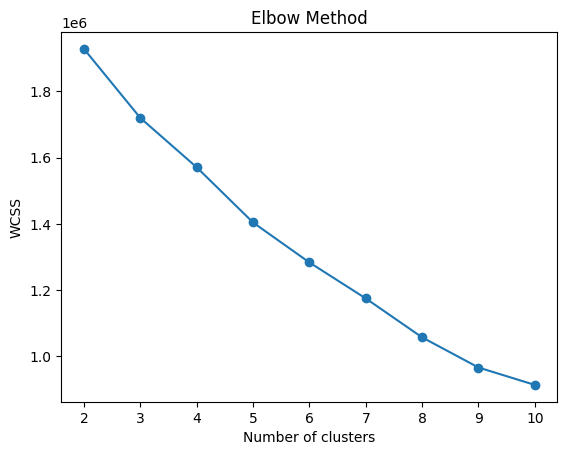

   male_participation_rate  killed_participation_rate  \
0                 0.843644                   0.252646   
1                 0.738296                   0.947048   
2                 0.128262                   0.107311   

   injuredd_participation_rate  killed/participants_rate  unharmed_rate  \
0                     0.561229                  0.006374       1.005318   
1                     0.294239                  0.717654       0.891417   
2                     0.124208                  0.122296       1.022453   

   adult_participation_rate  teen_participation_rate  \
0                  0.840865                 0.229658   
1                  0.744334                 0.214475   
2                  0.126593                 0.108542   

   child_participation_rate  arrested_participation_rate  \
0                  0.140672                     0.603703   
1                  0.144789                     0.433307   
2                  0.111583                     0.140338   

   f

In [ ]:
selected_columns = [
    'male_participation_rate',
    'killed_participation_rate',
    'injuredd_participation_rate',
    'killed/participants_rate',
    'unharmed_rate',
    'adult_participation_rate',
    'teen_participation_rate',
    'child_participation_rate',
    'arrested_participation_rate',
    'female_participation_rate',
    'arrested/participants_rate',
    'winnerParty_votes_percentage'
]

X = df_features[selected_columns]

# Handle missing values using mean imputation
imputer = SimpleImputer(strategy='mean')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=selected_columns)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Determine the optimal number of clusters (k) using the elbow method
wcss = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(2, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Based on the elbow method, choose the optimal k
optimal_k = 3  # Update with the value you find from the plot

# Perform K-means clustering with the optimal k
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', max_iter=300, n_init=10, random_state=0)
df_features['cluster'] = kmeans.fit_predict(X_scaled)

# Characterization of the obtained clusters
cluster_centroids = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=selected_columns)
print(cluster_centroids)

# Evaluation of the clustering results
silhouette_avg = silhouette_score(X_scaled, df_features['cluster'])
print(f'Silhouette Score: {silhouette_avg}')

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

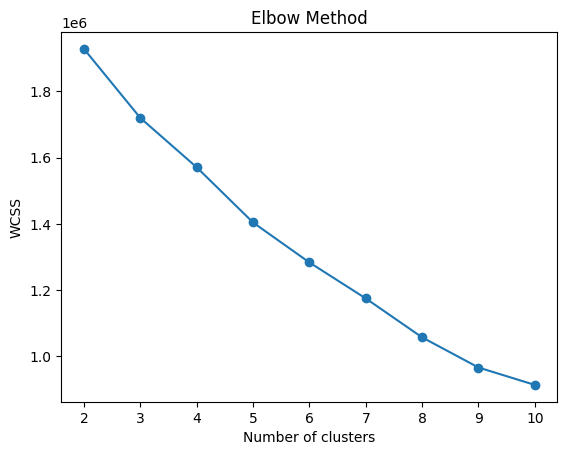

In [ ]:
wcss = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.plot(range(2, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()



# DATA CORRELATION

# DATA PREPARATION - New Features  GAETANO

*   How many males are involved in the incident w.r.t. the total number of males involved in incidents for the same city and in the same period?
*   How many injured and killed people have been involved w.r.t the total injured and killed people in the same congressional district in a given period of time?
*   Ratio of the number of the killed people in the incident w.r.t. the number of participants in the incident: it is an indicator if the incidents that occur cause killings
*   Ratio of unharmed people in the incident w.r.t. the average of unharmed people involved in incidents for the same period: it is an indicator if the incidents thata occur don't cause any issue to people involved
*   How many male/famale partecipants are involved w.r.t. to the number of total incident in the same period: indicator of how the gender of involved people is distributed across the incidents
* How many adult/child/teen partecipants are involved w.r.t. to the number of total incident in the same period: indicator of how the age of involved people is distributed across the incidents
* Ratio of the number of the injuried people in the incident w.r.t. the number of partecipants in the incident: it is an indicator if the incidents that occur cause injuries
* Ratio of the number of the arrested people in the incident w.r.t. the number of partecipangs in the incident: it is an indicator if the incidents that occur cause arrests
* Ratio of the total number of the incidents w.r.t to the poverty in the same period:it is an indicator whether the poverty index contributes in some way to the increase in accidents - FORSE è PIù UNA CORRELAZIONE CHE UNA FEATURE


**IMPORT DATA**

In [ ]:
import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df = pd.read_csv('/content/final_datasetV3.csv')
print(len(df))

213402


Casting features since when saving the dataframe in csv format it automatically changes the types to float64

In [ ]:
convert_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants',
                   'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                   'n_males', 'n_females','n_arrested','n_unharmed','candidatevotes','totalvotes']

df[convert_columns] = df[convert_columns].astype('Int64')

In [ ]:
df.sort_values(by=['city_or_county','year','month']).head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
13393,2014,1,LOUISIANA,Abbeville,3,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,0,1,0,1,2,Shot - Wounded/Injured,NaN,20.6,REPUBLICAN,185867,236268
13823,2014,6,LOUISIANA,Abbeville,3,19,20,20,0,0,3,3,0,1,0,0,2,3,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident,20.6,REPUBLICAN,185867,236268
14211,2014,9,LOUISIANA,Abbeville,3,22,22,22,0,0,3,2,1,0,1,0,2,3,Shot - Wounded/Injured,NaN,20.6,REPUBLICAN,185867,236268
14378,2014,11,LOUISIANA,Abbeville,3,17,18,18,0,1,3,3,0,0,0,0,4,4,Possession (gun(s) found during commission of ...,Brandishing/flourishing/open carry/lost/found,20.6,REPUBLICAN,185867,236268
14481,2014,12,LOUISIANA,Abbeville,3,<NA>,<NA>,<NA>,0,0,3,<NA>,<NA>,0,0,0,3,3,Shots Fired - No Injuries,Institution/Group/Business,20.6,REPUBLICAN,185867,236268
47327,2015,1,LOUISIANA,Abbeville,3,<NA>,<NA>,<NA>,0,0,1,<NA>,<NA>,0,1,0,0,1,Shot - Wounded/Injured,Gun(s) stolen from owner,20.0,REPUBLICAN,185867,236268
47430,2015,2,LOUISIANA,Abbeville,3,<NA>,<NA>,<NA>,0,0,2,<NA>,<NA>,0,2,0,0,2,Shot - Wounded/Injured,NaN,20.0,REPUBLICAN,185867,236268
71245,2016,2,ALABAMA,Abbeville,2,38,52,<NA>,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,Officer Involved Incident,16.0,REPUBLICAN,134886,276584
92587,2016,2,LOUISIANA,Abbeville,3,25,25,25,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,Possession of gun by felon or prohibited person,19.8,REPUBLICAN,77671,282443
114530,2016,8,SOUTH CAROLINA,Abbeville,3,50,50,50,0,0,2,1,1,0,1,1,0,2,Non-Shooting Incident,Domestic Violence,14.1,REPUBLICAN,196325,269540


In [ ]:
def calcola_moda(serie):
    moda = serie.mode()
    if len(moda) > 0:
        return moda.iloc[0]  # Restituisce il primo elemento in caso di più modi
    return None  # Restituisce None se la serie è vuota

In [ ]:
feature_dataset = None

**FEATURE 1: N_MALES RATIO**

In [ ]:
#FEATURE 1
#How many males are involved in the incident w.r.t. the total number of males involved
#in incidents for the same city and in the same period?

# decommentare se si vuole utilizzare tutto il DF
#df_reduced = df

#decommentare se si vuole utilizzare il DF senza alcune colonne
df_reduced = df.drop(columns=['incident_characteristics1','incident_characteristics2'])
df_reduced = df_reduced.groupby(['state', 'city_or_county', 'congressional_district', 'year']).agg({
        'min_age_participants': 'mean',
        'avg_age_participants': 'mean',
        'min_age_participants':'mean',
        'n_participants_child':'sum',
        'n_participants_teen':'sum',
        'n_participants_adult':'sum',
        'n_males':'sum',
        'n_females':'sum',
        'n_killed':'sum',
        'n_injured':'sum',
        'n_arrested':'sum',
        'n_unharmed':'sum',
        'n_participants':'sum',
        'povertyPercentage':'mean',
        'candidatevotes':'mean',
        'totalvotes':'mean',
        'party':calcola_moda}).reset_index()



result = df_reduced.groupby(['state','city_or_county', 'congressional_district', 'year']).apply(
    lambda x: x['n_males'] / x['n_males'].sum()
    ).reset_index(name='male_participation_rate')



#feature_dataset = feature_dataset.duplicated(subset=['state', 'city_or_county', 'congressional_district', 'year', 'month']).sum()
feature_dataset = result

print(feature_dataset.head(1))


     state city_or_county  congressional_district  year  level_4  \
0  ALABAMA      Abbeville                       2  2016        0   

   male_participation_rate  
0                      1.0  


In [ ]:
feature_dataset = feature_dataset.drop(columns=['level_4'])
print(len(feature_dataset))

41323


**FEATURE 2**

In [ ]:
#FEATURE 2
#How many injured and killed people have been involved w.r.t the total injured and
#killed people in the same congressional district in a given period of time?

# Grouping by congressional district and date (year and month), and calculating the required statistics
#result = df.groupby(['congressional_district', 'year', 'month']).apply(
#    lambda x: {
#        'total_injured': x['n_injured'].sum(),
#        'total_killed': x['n_killed'].sum(),
#        'total_injured_killed': x['n_injured'].sum() + x['n_killed'].sum()
#    }
#).reset_index()

result = df_reduced.groupby(['state', 'city_or_county','congressional_district', 'year']).apply(
    lambda x: x['n_killed'] / x['n_killed'].sum()
).reset_index(name='killed_participation_rate')
#result = result.drop(columns='level_3')

In [ ]:
result = result.drop(columns='level_4')
feature_dataset = pd.merge(feature_dataset, result, on=['state', 'city_or_county', 'congressional_district', 'year'], how='inner')

In [ ]:
print(len(df))
print(len(df_reduced))
print(len(feature_dataset))
print(feature_dataset.head(1))

213402
41323
41323
     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   male_participation_rate  killed_participation_rate  
0                      1.0                        NaN  


**FEATURE 3**

In [ ]:
# Calculating the ratio of the number of killed people to the number of participants in each incident
df_reduced['killed_participant_ratio'] = df_reduced['n_killed'] / df_reduced['n_participants']

In [ ]:
result = df_reduced[['state', 'city_or_county', 'congressional_district', 'year', 'killed_participant_ratio']]
print(result.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   killed_participant_ratio  
0                       0.0  


In [ ]:
feature_dataset = feature_dataset.merge(result, on=['state', 'city_or_county', 'congressional_district', 'year'],how='inner')
print(feature_dataset.head(1))
print(len(feature_dataset))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   male_participation_rate  killed_participation_rate  \
0                      1.0                        NaN   

   killed_participant_ratio  
0                       0.0  
41323


**FEATURE 4**

In [ ]:
# Calculating the average number of unharmed people for each period
avg_unharmed_per_period = df_reduced.groupby(['state', 'city_or_county', 'congressional_district', 'year'])['n_unharmed'].mean().reset_index()
avg_unharmed_per_period.rename(columns={'n_unharmed': 'avg_unharmed'}, inplace=True)

print(avg_unharmed_per_period.head(1))


     state city_or_county  congressional_district  year  avg_unharmed
0  ALABAMA      Abbeville                       2  2016           0.0


In [ ]:
# Merging the average back into the original dataframe
df_reduced = df_reduced.merge(avg_unharmed_per_period, on=['state', 'city_or_county', 'congressional_district', 'year'],how='inner')

print(df_reduced.head(1))

     state city_or_county  congressional_district  year  min_age_participants  \
0  ALABAMA      Abbeville                       2  2016                  38.0   

   avg_age_participants  n_participants_child  n_participants_teen  \
0                  52.0                     0                    0   

   n_participants_adult  n_males  n_females  n_killed  n_injured  n_arrested  \
0                     1        1          0         0          1           0   

   n_unharmed  n_participants  povertyPercentage  candidatevotes  totalvotes  \
0           0               1               16.0        134886.0    276584.0   

        party  killed_participant_ratio  avg_unharmed  
0  REPUBLICAN                       0.0           0.0  


In [ ]:
# Calculating the ratio
df_reduced['unharmed_ratio'] = df_reduced['n_unharmed'] / df_reduced['avg_unharmed']

In [ ]:
result = df_reduced[['state', 'city_or_county', 'congressional_district', 'year', 'unharmed_ratio']]

In [ ]:
feature_dataset = feature_dataset.merge(result, on=['state', 'city_or_county', 'congressional_district', 'year'], how='inner')
print(feature_dataset.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   male_participation_rate  killed_participation_rate  \
0                      1.0                        NaN   

   killed_participant_ratio  unharmed_ratio  
0                       0.0             NaN  


**FEATURE 5**

In [ ]:
# Calculating the total number of incidents per period
total_incidents_per_period = df_reduced.groupby(['state', 'city_or_county', 'congressional_district', 'year']).size().reset_index(name='total_incidents')

# Summing male and female participants per period
gender_totals_per_period = df_reduced.groupby(['state', 'city_or_county', 'congressional_district', 'year'])[['n_males', 'n_females']].sum().reset_index()

# Merging the total incidents into the gender totals
gender_totals_per_period = gender_totals_per_period.merge(total_incidents_per_period, on=['state', 'city_or_county', 'congressional_district', 'year'])

# Calculating the ratios
gender_totals_per_period['male_participant_ratio'] = gender_totals_per_period['n_males'] / gender_totals_per_period['total_incidents']
gender_totals_per_period['female_participant_ratio'] = gender_totals_per_period['n_females'] / gender_totals_per_period['total_incidents']

result = gender_totals_per_period[['state', 'city_or_county', 'congressional_district', 'year', 'total_incidents', 'male_participant_ratio', 'female_participant_ratio']]

In [ ]:
feature_dataset = feature_dataset.merge(result, on=['state', 'city_or_county', 'congressional_district', 'year'],how='inner')
print(feature_dataset.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   male_participation_rate  killed_participation_rate  \
0                      1.0                        NaN   

   killed_participant_ratio  unharmed_ratio  total_incidents  \
0                       0.0             NaN                1   

   male_participant_ratio  female_participant_ratio  
0                     1.0                       0.0  


**FEATURE 6**

In [ ]:
# Calculating the total number of incidents per period
total_incidents_per_period = df_reduced.groupby(['state', 'city_or_county', 'congressional_district', 'year']).size().reset_index(name='total_incidents')

# Summing child, teen, and adult participants per period
age_group_totals_per_period = df_reduced.groupby(['state', 'city_or_county', 'congressional_district', 'year'])[['n_participants_child', 'n_participants_teen', 'n_participants_adult']].sum().reset_index()

# Merging the total incidents into the age group totals
age_group_totals_per_period = age_group_totals_per_period.merge(total_incidents_per_period, on=['state', 'city_or_county', 'congressional_district', 'year'])

# Calculating the ratios
age_group_totals_per_period['child_participant_ratio'] = age_group_totals_per_period['n_participants_child'] / age_group_totals_per_period['total_incidents']
age_group_totals_per_period['teen_participant_ratio'] = age_group_totals_per_period['n_participants_teen'] / age_group_totals_per_period['total_incidents']
age_group_totals_per_period['adult_participant_ratio'] = age_group_totals_per_period['n_participants_adult'] / age_group_totals_per_period['total_incidents']

result = age_group_totals_per_period[['state', 'city_or_county', 'congressional_district', 'year', 'child_participant_ratio', 'teen_participant_ratio', 'adult_participant_ratio']]

In [ ]:
feature_dataset = feature_dataset.merge(result, on=['state', 'city_or_county', 'congressional_district', 'year'], how='inner')
print(feature_dataset.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   male_participation_rate  killed_participation_rate  \
0                      1.0                        NaN   

   killed_participant_ratio  unharmed_ratio  total_incidents  \
0                       0.0             NaN                1   

   male_participant_ratio  female_participant_ratio  child_participant_ratio  \
0                     1.0                       0.0                      0.0   

   teen_participant_ratio  adult_participant_ratio  
0                     0.0                      1.0  


**FEATURE 7**

In [ ]:
# Calculating the ratio of the number of injured people to the number of participants in each incident
df_reduced['injured_participant_ratio'] = df_reduced['n_injured'] / df_reduced['n_participants']

result = df_reduced[['state', 'city_or_county', 'congressional_district', 'year', 'injured_participant_ratio']]
print (result.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   injured_participant_ratio  
0                        1.0  


In [ ]:
feature_dataset = feature_dataset.merge(result, on=['state', 'city_or_county', 'congressional_district', 'year'], how='inner')
print(feature_dataset.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   male_participation_rate  killed_participation_rate  \
0                      1.0                        NaN   

   killed_participant_ratio  unharmed_ratio  total_incidents  \
0                       0.0             NaN                1   

   male_participant_ratio  female_participant_ratio  child_participant_ratio  \
0                     1.0                       0.0                      0.0   

   teen_participant_ratio  adult_participant_ratio  injured_participant_ratio  
0                     0.0                      1.0                        1.0  


**FEATURE 8**

In [ ]:
# Calculating the ratio of the number of arrested people to the number of participants in each incident
df_reduced['arrested_participant_ratio'] = df_reduced['n_arrested'] / df_reduced['n_participants']

result = df_reduced[['state', 'city_or_county', 'congressional_district', 'year', 'arrested_participant_ratio']]
print (result.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   arrested_participant_ratio  
0                         0.0  


In [ ]:
feature_dataset = feature_dataset.merge(result, on=['state', 'city_or_county', 'congressional_district', 'year'], how='inner')
print(feature_dataset.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   male_participation_rate  killed_participation_rate  \
0                      1.0                        NaN   

   killed_participant_ratio  unharmed_ratio  total_incidents  \
0                       0.0             NaN                1   

   male_participant_ratio  female_participant_ratio  child_participant_ratio  \
0                     1.0                       0.0                      0.0   

   teen_participant_ratio  adult_participant_ratio  injured_participant_ratio  \
0                     0.0                      1.0                        1.0   

   arrested_participant_ratio  
0                         0.0  


**FEATURE 9**

In [ ]:
# Grouping data by year and month to count the number of incidents
incident_counts = df_reduced.groupby(['state', 'city_or_county', 'congressional_district', 'year']).size().reset_index(name='incident_count')

# Averaging the poverty percentage for each period
avg_poverty_per_period = df_reduced.groupby(['state', 'city_or_county', 'congressional_district', 'year'])['povertyPercentage'].mean().reset_index()

# Merging the counts and averages
result = incident_counts.merge(avg_poverty_per_period, on=['state', 'city_or_county', 'congressional_district', 'year'],how='inner')

print (result.head(1))

     state city_or_county  congressional_district  year  incident_count  \
0  ALABAMA      Abbeville                       2  2016               1   

   povertyPercentage  
0               16.0  


In [ ]:
feature_dataset = feature_dataset.merge(result, on=['state', 'city_or_county', 'congressional_district', 'year'],how='inner')
print(feature_dataset.head(1))

     state city_or_county  congressional_district  year  \
0  ALABAMA      Abbeville                       2  2016   

   male_participation_rate  killed_participation_rate  \
0                      1.0                        NaN   

   killed_participant_ratio  unharmed_ratio  total_incidents  \
0                       0.0             NaN                1   

   male_participant_ratio  female_participant_ratio  child_participant_ratio  \
0                     1.0                       0.0                      0.0   

   teen_participant_ratio  adult_participant_ratio  injured_participant_ratio  \
0                     0.0                      1.0                        1.0   

   arrested_participant_ratio  incident_count  povertyPercentage  
0                         0.0               1               16.0  


In [ ]:
feature_dataset.to_csv('feature_dataset.csv')